# FairPFN Overview

In [ ]:
# Standardizing the semi-synthetic result files to include a new column for bias level and data type.
import pandas as pd
import re

# List of all the semi-synthetic result files to update
files_to_update = [
    "CFFair_semi_syn_results.csv",
    "CLAIRE_semi_syn_results.csv",
    "SRCVAE_semi_syn_results.csv",
    "xgb_semi_syn_results.csv",
    "fairpfn_semi_syn_results.csv"
]

for file in files_to_update:
    try:
        # 1. Load the results file
        df = pd.read_csv(file)
        
        # 2. Extract the bias level (the 3rd item when splitting by '_')
        # Includes a quick check to ensure the filename has enough underscores
        df['bias_level'] = df['name_dataset'].apply(
            lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else "Unknown"
        )
        
        # 3. Save it back, overwriting the original file
        df.to_csv(file, index=False)
        print(f"Successfully updated bias_level in: {file}")
        
    except FileNotFoundError:
        print(f"Skipped {file} - File not found in the current directory.")
        
print("\nAll files processed!")

#fix data type column in all the semi-synthetic result files

def extract_data_type(filename):
    """
    Looks for the pattern: 'eed' + (any chars) + '0_'
    and extracts the segment following '0_' up to the extension.
    """
    # Regex breakdown:
    # eed.*0_  : Matches 'eed', then any characters, then '0_'
    # ([^.]+?) : Captures the data type (anything until the next dot)
    # \.csv    : Matches the literal .csv extension
    pattern = r'eed.*0_([^.]+?)\.csv'
    
    match = re.search(pattern, filename, re.IGNORECASE)
    
    if match:
        return match.group(1).upper()
    return "Unknown"

for file in files_to_update:
    try:
        # Assuming the CSV contains a column 'name_dataset' with filenames
        df = pd.read_csv(file)
        
        if 'name_dataset' in df.columns:
            df['data_type'] = df['name_dataset'].apply(extract_data_type)
            df.to_csv(file, index=False)
            print(f"Successfully updated: {file}")
        else:
            print(f"Column 'name_dataset' not found in {file}")
            
    except Exception as e:
        print(f"Error processing {file}: {e}")

print("Processing complete.")

Successfully updated bias_level in: CFFair_semi_syn_results.csv
Successfully updated bias_level in: CLAIRE_semi_syn_results.csv
Successfully updated bias_level in: SRCVAE_semi_syn_results.csv
Successfully updated bias_level in: xgb_semi_syn_results.csv
Successfully updated bias_level in: fairpfn_semi_syn_results.csv

All files processed!
Successfully updated: CFFair_semi_syn_results.csv
Successfully updated: CLAIRE_semi_syn_results.csv
Successfully updated: SRCVAE_semi_syn_results.csv
Successfully updated: xgb_semi_syn_results.csv
Successfully updated: fairpfn_semi_syn_results.csv
Processing complete.


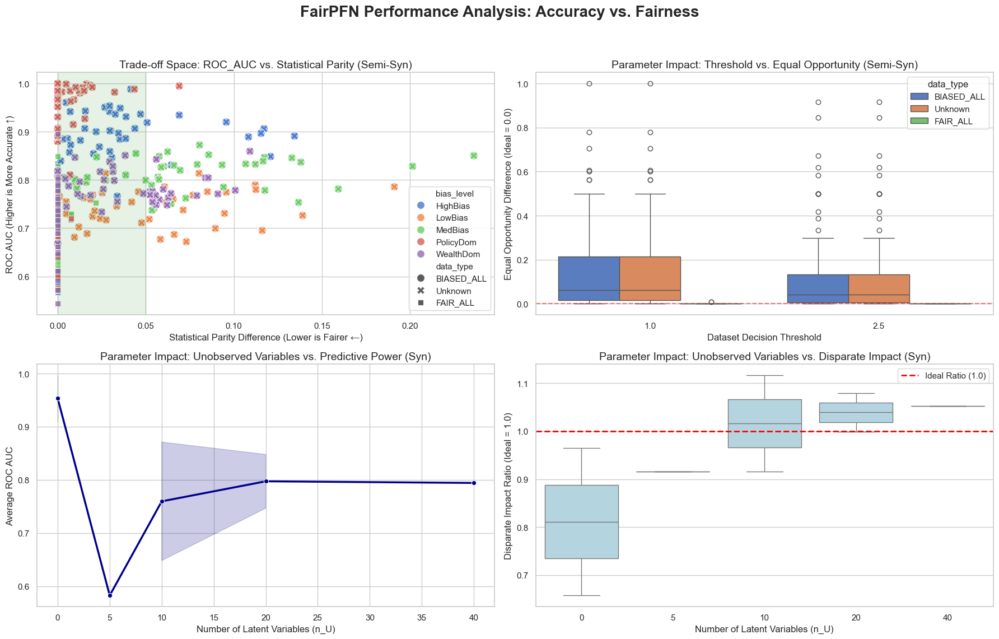

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Set global seaborn styling for publication-quality plots
sns.set_theme(style="whitegrid", palette="muted")

def analyze_fairpfn_results(syn_csv="fairpfn_results.csv", semi_syn_csv="fairpfn_semi_syn_results.csv"):
    """
    Loads the FairPFN results CSVs and generates visualizations explaining 
    the relationship between dataset parameters, predictive accuracy, and fairness.
    """
    
    # 1. Load Data
    if not os.path.exists(semi_syn_csv) or not os.path.exists(syn_csv):
        print("Please ensure the CSV files are in the same directory as this script.")
        return

    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_syn_csv)
    
    # Drop rows where fairness metrics might be NaN (e.g., when no protected attribute was found)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Create a Matplotlib Figure with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('FairPFN Performance Analysis: Accuracy vs. Fairness', fontsize=20, fontweight='bold')

    # ==============================================================================
    # VIZ 1: The Accuracy-Fairness Trade-off (Semi-Synthetic Data)
    # Explains: How does Bias Level affect the trade-off between AUC and ATE?
    # ==============================================================================
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    ax1.set_title('Trade-off Space: ROC_AUC vs. Statistical Parity (Semi-Syn)', fontsize=14)
    ax1.set_xlabel('Statistical Parity Difference (Lower is Fairer \u2190)')
    ax1.set_ylabel('ROC AUC (Higher is More Accurate \u2191)')
    
    # Highlight the "Ideal Zone" (High Accuracy, High Fairness)
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    
    # ==============================================================================
    # VIZ 2: Parameter Impact on Fairness (Semi-Synthetic Data)
    # Explains: How does the threshold affect Equal Opportunity?
    # ==============================================================================
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='threshold', 
        y='Equal_Opportunity_Diff', 
        hue='data_type', 
        ax=ax2
    )
    ax2.set_title('Parameter Impact: Threshold vs. Equal Opportunity (Semi-Syn)', fontsize=14)
    ax2.set_xlabel('Dataset Decision Threshold')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', alpha=0.5)

    # ==============================================================================
    # VIZ 3: Parameter Impact on Predictive Power (Synthetic Data)
    # Explains: How does the number of Unobserved Variables (n_U) affect AUC?
    # ==============================================================================
    ax3 = axes[1, 0]
    sns.lineplot(
        data=df_syn, 
        x='n_U', 
        y='ROC_AUC', 
        marker='o',
        linewidth=2.5,
        ax=ax3,
        color='darkblue'
    )
    ax3.set_title('Parameter Impact: Unobserved Variables vs. Predictive Power (Syn)', fontsize=14)
    ax3.set_xlabel('Number of Latent Variables (n_U)')
    ax3.set_ylabel('Average ROC AUC')

    # ==============================================================================
    # VIZ 4: Parameter Impact on Fairness (Synthetic Data)
    # Explains: How does n_U affect the Disparate Impact Ratio?
    # ==============================================================================
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_syn, 
        x='n_U', 
        y='Disparate_Impact_Ratio', 
        ax=ax4,
        color='lightblue'
    )
    ax4.set_title('Parameter Impact: Unobserved Variables vs. Disparate Impact (Syn)', fontsize=14)
    ax4.set_xlabel('Number of Latent Variables (n_U)')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    # Draw a line at the ideal DIR of 1.0
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='Ideal Ratio (1.0)')
    ax4.legend()

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    analyze_fairpfn_results()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\1701034530.py:63: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
C:\Users\patri\AppData\Local\Temp\ipykernel_5448\1701034530.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


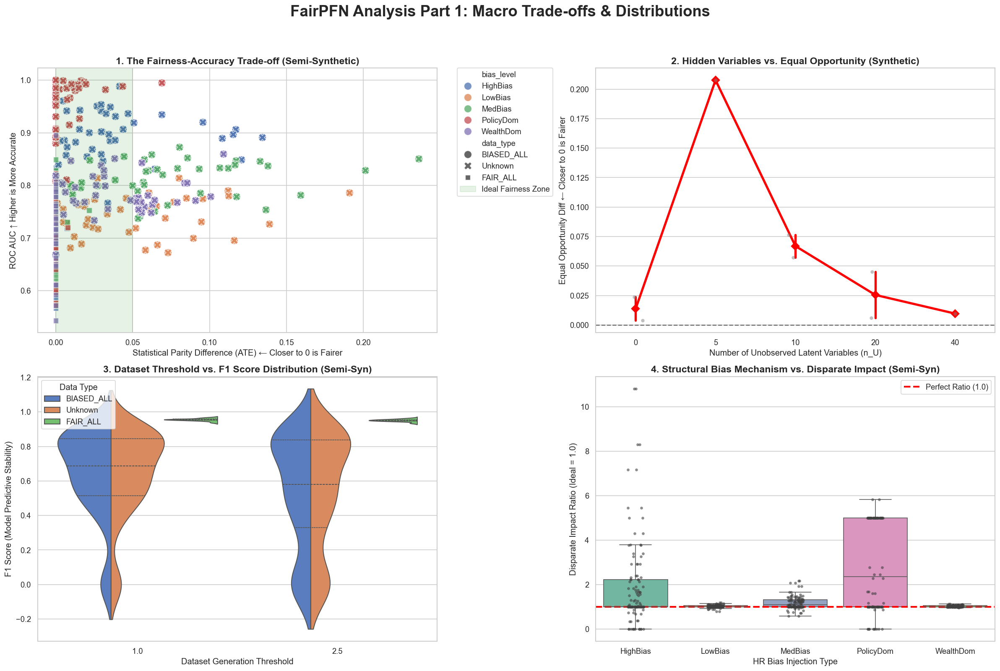

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_data():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "fairpfn_results.csv"
    semi_csv = "fairpfn_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    return df_syn, df_semi

def plot_part1_dashboard():
    df_syn, df_semi = load_and_clean_data()
    
    # Create a 2x2 grid for our macro-analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('FairPFN Analysis Part 1: Macro Trade-offs & Distributions', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Global Trade-off (AUC vs ATE) by Bias Level
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level', 
        style='data_type',
        s=120, alpha=0.75, ax=ax1
    )
    ax1.set_title('1. The Fairness-Accuracy Trade-off (Semi-Synthetic)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Statistical Parity Difference (ATE) \u2190 Closer to 0 is Fairer')
    ax1.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # ---------------------------------------------------------
    # GRAPH 2: Impact of Latent Variables (n_U) on Equal Opportunity
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    # We use a strip plot overlaid with a point plot to see individual variance + the trend
    sns.stripplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', alpha=0.5, color='gray', ax=ax2)
    sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
    ax2.set_title('2. Hidden Variables vs. Equal Opportunity (Synthetic)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax2.set_ylabel('Equal Opportunity Diff \u2190 Closer to 0 is Fairer')
    ax2.axhline(0, color='black', linestyle='--', alpha=0.5)

    # ---------------------------------------------------------
    # GRAPH 3: Decision Threshold vs. Predictive Stability
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    # Violin plots show the exact density/distribution of F1 scores across thresholds
    sns.violinplot(
        data=df_semi, 
        x='threshold', 
        y='F1_Score', 
        hue='data_type',
        split=True, # Splits the violin to compare BIASED vs FAIR datasets directly
        inner="quart",
        ax=ax3,
        palette="muted"
    )
    ax3.set_title('3. Dataset Threshold vs. F1 Score Distribution (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Dataset Generation Threshold')
    ax3.set_ylabel('F1 Score (Model Predictive Stability)')
    ax3.legend(title='Data Type')

    # ---------------------------------------------------------
    # GRAPH 4: Bias Level vs. Disparate Impact Ratio
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_semi, 
        x='bias_level', 
        y='Disparate_Impact_Ratio', 
        palette='Set2',
        showfliers=False, # Hide massive outliers to see the interquartile range clearly
        ax=ax4
    )
    # Add jittered points on top of the boxplot to see the exact spread of datasets
    sns.stripplot(data=df_semi, x='bias_level', y='Disparate_Impact_Ratio', color=".25", alpha=0.6, size=4, ax=ax4)
    ax4.set_title('4. Structural Bias Mechanism vs. Disparate Impact (Semi-Syn)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('HR Bias Injection Type')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2.5, label='Perfect Ratio (1.0)')
    ax4.legend()

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_part1_dashboard()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\1464123103.py:78: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])


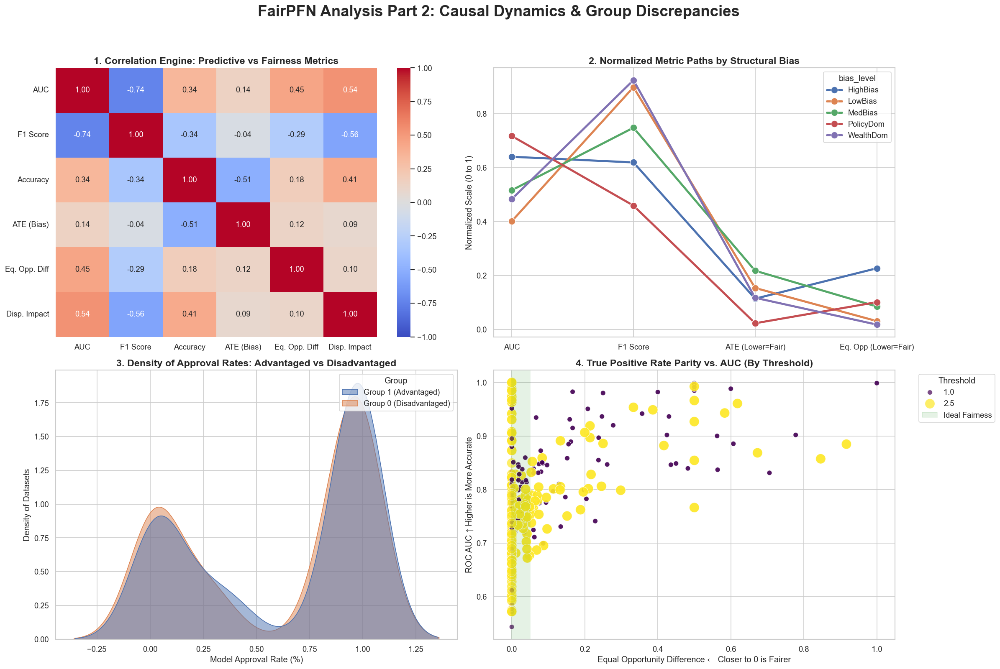

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_data():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    semi_csv = "fairpfn_semi_syn_results.csv"
    
    if not os.path.exists(semi_csv):
        raise FileNotFoundError(f"Could not find {semi_csv} in the current directory.")
        
    df_semi = pd.read_csv(semi_csv)
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists (using our extraction logic if it wasn't saved)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if len(x.split('_')) > 2 else 'Unknown')
         
    return df_semi

def plot_part2_dashboard():
    df_semi = load_and_clean_data()
    
    # Create a 2x2 grid for our dynamic analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('FairPFN Analysis Part 2: Causal Dynamics & Group Discrepancies', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Metric Correlation Heatmap
    # Explains: Do Predictive Power and Fairness inherently conflict?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    cols_to_correlate = [
        'ROC_AUC', 'F1_Score', 'Accuracy', 
        'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff', 'Disparate_Impact_Ratio'
    ]
    # Calculate Pearson Correlation
    corr_matrix = df_semi[cols_to_correlate].corr()
    
    # Custom labels for cleaner presentation
    labels = ['AUC', 'F1 Score', 'Accuracy', 'ATE (Bias)', 'Eq. Opp. Diff', 'Disp. Impact']
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
                xticklabels=labels, yticklabels=labels, ax=ax1, vmin=-1, vmax=1)
    ax1.set_title('1. Correlation Engine: Predictive vs Fairness Metrics', fontsize=14, fontweight='bold')

    # ---------------------------------------------------------
    # GRAPH 2: Parallel Coordinates (Average Paths by Bias Level)
    # Explains: How does a dataset's bias level shift all metrics simultaneously?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    
    # Select key metrics to trace
    trace_cols = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    # Normalize the data (0 to 1) so AUC (usually 0.5-1.0) and ATE (0.0-0.3) can be plotted on the same Y-axis
    scaler = MinMaxScaler()
    df_norm = df_semi.copy()
    df_norm[trace_cols] = scaler.fit_transform(df_norm[trace_cols])
    
    # Melt the dataframe for Seaborn lineplot compatibility
    df_melted = df_norm.melt(id_vars=['bias_level'], value_vars=trace_cols, 
                             var_name='Metric', value_name='Normalized Score')
    
    # Plot the average path for each bias level
    sns.lineplot(data=df_melted, x='Metric', y='Normalized Score', hue='bias_level', 
                 estimator='mean', errorbar=None, marker='o', linewidth=3, markersize=10, ax=ax2)
    
    # Clean up the X-axis labels
    ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])
    ax2.set_title('2. Normalized Metric Paths by Structural Bias', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Normalized Scale (0 to 1)')
    ax2.set_xlabel('')

    # ---------------------------------------------------------
    # GRAPH 3: Positive Rate Discrepancy (Group 1 vs Group 0)
    # Explains: HOW is the model discriminating?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    
    # Melt the positive rates to plot them side-by-side as a density distribution
    df_rates = df_semi.melt(id_vars=['bias_level'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                            var_name='Group', value_name='Approval Rate')
    df_rates['Group'] = df_rates['Group'].replace({'Pos_Rate_S1': 'Group 1 (Advantaged)', 'Pos_Rate_S0': 'Group 0 (Disadvantaged)'})
    
    sns.kdeplot(data=df_rates, x='Approval Rate', hue='Group', fill=True, common_norm=False, alpha=0.5, ax=ax3)
    ax3.set_title('3. Density of Approval Rates: Advantaged vs Disadvantaged', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Model Approval Rate (%)')
    ax3.set_ylabel('Density of Datasets')

    # ---------------------------------------------------------
    # GRAPH 4: Equal Opportunity vs AUC faceted by Threshold
    # Explains: Does the strictness of the decision threshold break fairness?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Scatter plot tracking Eq Opp vs AUC, using threshold for size/color to spot clusters
    sns.scatterplot(
        data=df_semi, 
        x='Equal_Opportunity_Diff', 
        y='ROC_AUC', 
        hue='threshold', 
        size='threshold',
        sizes=(50, 200),
        alpha=0.7,
        palette='viridis',
        ax=ax4
    )
    ax4.set_title('4. True Positive Rate Parity vs. AUC (By Threshold)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Equal Opportunity Difference \u2190 Closer to 0 is Fairer')
    ax4.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    
    # Highlight Ideal Zone
    ax4.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness')
    handles, labels = ax4.get_legend_handles_labels()
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Threshold")

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_part2_dashboard()

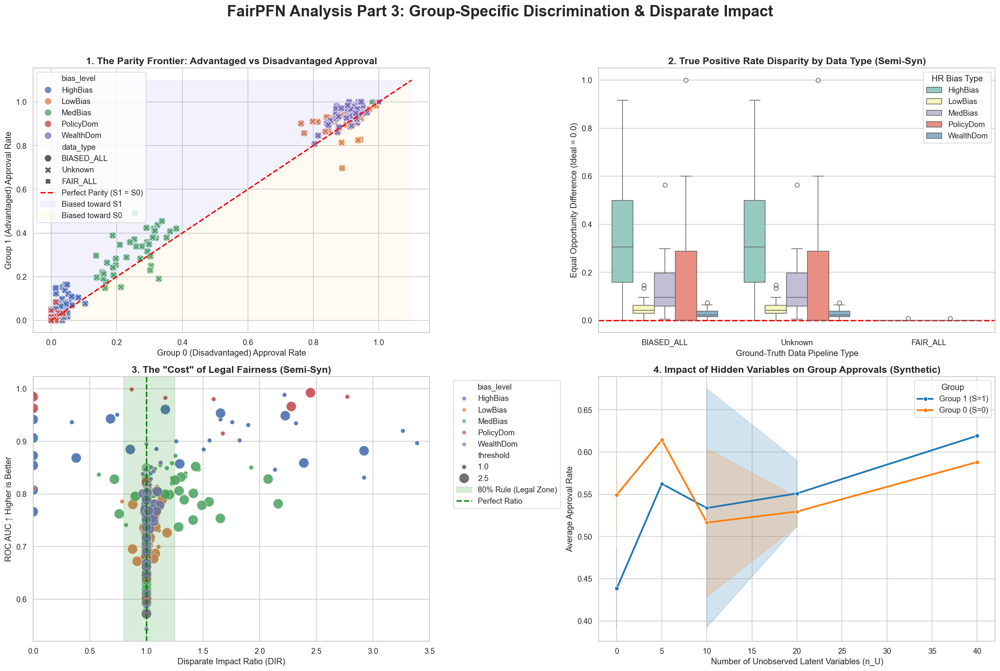

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_data():
    """Loads both CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "fairpfn_results.csv"
    semi_csv = "fairpfn_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to 5.0 for visualization
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if len(x.split('_')) > 2 else 'Unknown')
         
    return df_syn, df_semi

def plot_part3_dashboard():
    df_syn, df_semi = load_and_clean_data()
    
    # Create a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('FairPFN Analysis Part 3: Group-Specific Discrimination & Disparate Impact', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: The Parity Frontier (S1 vs S0 Positivity Rates)
    # Explains: Is the model systematically favoring one group over the other?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Pos_Rate_S0', 
        y='Pos_Rate_S1', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    # Draw the Line of Perfect Parity (y=x)
    max_val = max(df_semi['Pos_Rate_S0'].max(), df_semi['Pos_Rate_S1'].max()) + 0.1
    ax1.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Parity (S1 = S0)')
    
    # Fill areas to show bias direction
    ax1.fill_between([0, max_val], [0, max_val], max_val, color='blue', alpha=0.05, label='Biased toward S1')
    ax1.fill_between([0, max_val], 0, [0, max_val], color='orange', alpha=0.05, label='Biased toward S0')
    
    ax1.set_title('1. The Parity Frontier: Advantaged vs Disadvantaged Approval', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Group 0 (Disadvantaged) Approval Rate')
    ax1.set_ylabel('Group 1 (Advantaged) Approval Rate')
    ax1.legend(loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 2: Equal Opportunity Difference by Data Type
    # Explains: Does supplying perfectly FAIR labels fix TPR disparity?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='data_type', 
        y='Equal_Opportunity_Diff', 
        hue='bias_level',
        ax=ax2,
        palette='Set3'
    )
    ax2.set_title('2. True Positive Rate Disparity by Data Type (Semi-Syn)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Ground-Truth Data Pipeline Type')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.legend(title='HR Bias Type', loc='upper right')

    # ---------------------------------------------------------
    # GRAPH 3: Disparate Impact vs. Accuracy
    # Explains: What is the predictive cost of achieving legal fairness?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Disparate_Impact_Ratio', 
        y='ROC_AUC', 
        hue='bias_level',
        size='threshold',
        sizes=(40, 200),
        alpha=0.7,
        ax=ax3
    )
    ax3.set_title('3. The "Cost" of Legal Fairness (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Disparate Impact Ratio (DIR)')
    ax3.set_ylabel('ROC AUC \u2191 Higher is Better')
    
    # The 80% Rule (Four-Fifths Rule) typically defines legally acceptable DIR between 0.8 and 1.25
    ax3.axvspan(0.8, 1.25, color='green', alpha=0.15, label='80% Rule (Legal Zone)')
    ax3.axvline(1.0, color='green', linestyle='--', linewidth=2, label='Perfect Ratio')
    ax3.set_xlim(0, 3.5) # Cap X axis slightly to focus on the dense area
    
    # Fix legend
    handles, labels = ax3.get_legend_handles_labels()
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 4: Latent Variables vs. Group Approval Rates (Synthetic)
    # Explains: As U increases, do the groups diverge?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Melt the synthetic data to plot both S1 and S0 rates on the same axis over n_U
    df_syn_melt = df_syn.melt(id_vars=['n_U'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                              var_name='Group', value_name='Approval Rate')
    
    df_syn_melt['Group'] = df_syn_melt['Group'].replace({'Pos_Rate_S1': 'Group 1 (S=1)', 'Pos_Rate_S0': 'Group 0 (S=0)'})
    
    sns.lineplot(
        data=df_syn_melt, 
        x='n_U', 
        y='Approval Rate', 
        hue='Group',
        marker='o',
        linewidth=2.5,
        palette=['#1f77b4', '#ff7f0e'],
        ax=ax4,
        errorbar='ci'
    )
    ax4.set_title('4. Impact of Hidden Variables on Group Approvals (Synthetic)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax4.set_ylabel('Average Approval Rate')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_part3_dashboard()

# CLAIRE

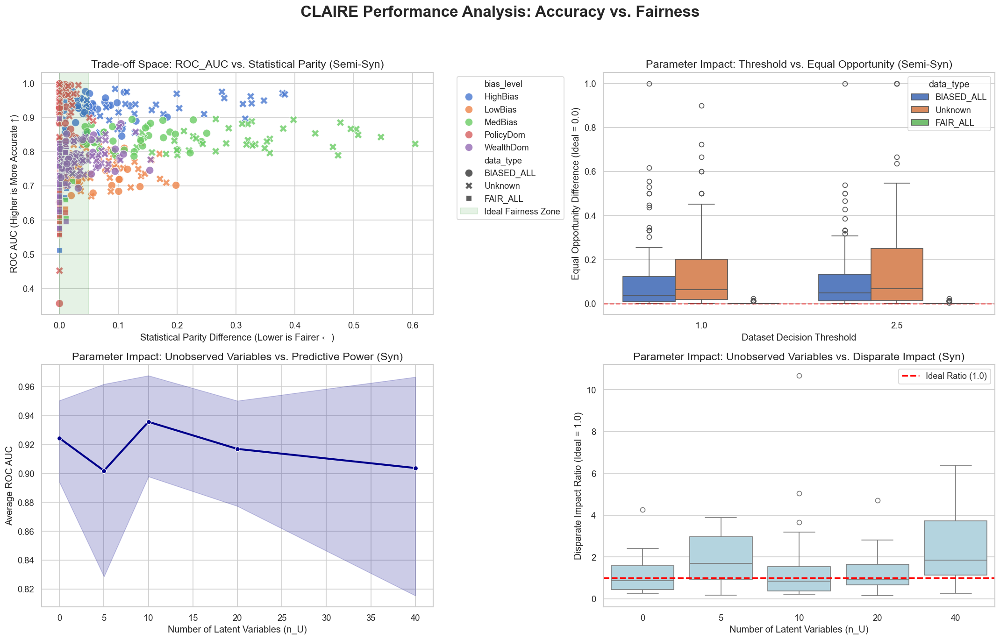

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set global seaborn styling for publication-quality plots
sns.set_theme(style="whitegrid", palette="muted")

def analyze_claire_results(syn_csv="CLAIRE_syn_results.csv", semi_syn_csv="CLAIRE_semi_syn_results.csv"):
    """
    Loads the CLAIRE results CSVs and generates visualizations explaining 
    the relationship between dataset parameters, predictive accuracy, and fairness.
    """
    
    # 1. Load Data
    if not os.path.exists(semi_syn_csv) or not os.path.exists(syn_csv):
        print("Please ensure the CSV files are in the same directory as this script.")
        return

    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_syn_csv)
    
    # Drop rows where fairness metrics might be NaN (e.g., when no protected attribute was found)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number (e.g., 5.0) for visualization purposes
    # (CLAIRE is prone to returning 'inf' if Group 0 gets exactly 0 positive predictions)
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Create a Matplotlib Figure with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('CLAIRE Performance Analysis: Accuracy vs. Fairness', fontsize=20, fontweight='bold')

    # ==============================================================================
    # VIZ 1: The Accuracy-Fairness Trade-off (Semi-Synthetic Data)
    # Explains: How does Bias Level affect the trade-off between AUC and ATE?
    # ==============================================================================
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    ax1.set_title('Trade-off Space: ROC_AUC vs. Statistical Parity (Semi-Syn)', fontsize=14)
    ax1.set_xlabel('Statistical Parity Difference (Lower is Fairer \u2190)')
    ax1.set_ylabel('ROC AUC (Higher is More Accurate \u2191)')
    
    # Highlight the "Ideal Zone" (High Accuracy, High Fairness)
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ==============================================================================
    # VIZ 2: Parameter Impact on Fairness (Semi-Synthetic Data)
    # Explains: How does the threshold affect Equal Opportunity?
    # ==============================================================================
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='threshold', 
        y='Equal_Opportunity_Diff', 
        hue='data_type', 
        ax=ax2
    )
    ax2.set_title('Parameter Impact: Threshold vs. Equal Opportunity (Semi-Syn)', fontsize=14)
    ax2.set_xlabel('Dataset Decision Threshold')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', alpha=0.5)

    # ==============================================================================
    # VIZ 3: Parameter Impact on Predictive Power (Synthetic Data)
    # Explains: How does the number of Unobserved Variables (n_U) affect AUC?
    # ==============================================================================
    ax3 = axes[1, 0]
    sns.lineplot(
        data=df_syn, 
        x='n_U', 
        y='ROC_AUC', 
        marker='o',
        linewidth=2.5,
        ax=ax3,
        color='darkblue'
    )
    ax3.set_title('Parameter Impact: Unobserved Variables vs. Predictive Power (Syn)', fontsize=14)
    ax3.set_xlabel('Number of Latent Variables (n_U)')
    ax3.set_ylabel('Average ROC AUC')

    # ==============================================================================
    # VIZ 4: Parameter Impact on Fairness (Synthetic Data)
    # Explains: How does n_U affect the Disparate Impact Ratio?
    # ==============================================================================
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_syn, 
        x='n_U', 
        y='Disparate_Impact_Ratio', 
        ax=ax4,
        color='lightblue'
    )
    ax4.set_title('Parameter Impact: Unobserved Variables vs. Disparate Impact (Syn)', fontsize=14)
    ax4.set_xlabel('Number of Latent Variables (n_U)')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    # Draw a line at the ideal DIR of 1.0
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='Ideal Ratio (1.0)')
    ax4.legend()

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    analyze_claire_results()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\3177765302.py:63: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
C:\Users\patri\AppData\Local\Temp\ipykernel_5448\3177765302.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


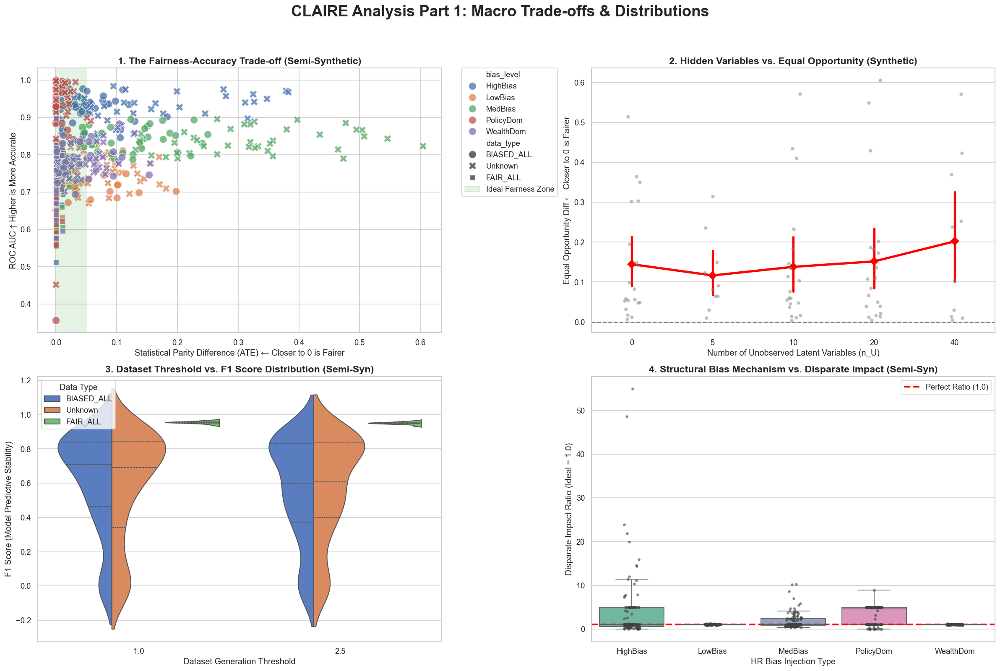

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_data():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "CLAIRE_syn_results.csv"
    semi_csv = "CLAIRE_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    return df_syn, df_semi

def plot_claire_part1_dashboard():
    df_syn, df_semi = load_and_clean_data()
    
    # Create a 2x2 grid for our macro-analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CLAIRE Analysis Part 1: Macro Trade-offs & Distributions', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Global Trade-off (AUC vs ATE) by Bias Level
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level', 
        style='data_type',
        s=120, alpha=0.75, ax=ax1
    )
    ax1.set_title('1. The Fairness-Accuracy Trade-off (Semi-Synthetic)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Statistical Parity Difference (ATE) \u2190 Closer to 0 is Fairer')
    ax1.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # ---------------------------------------------------------
    # GRAPH 2: Impact of Latent Variables (n_U) on Equal Opportunity
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    # We use a strip plot overlaid with a point plot to see individual variance + the trend
    sns.stripplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', alpha=0.5, color='gray', ax=ax2)
    sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
    ax2.set_title('2. Hidden Variables vs. Equal Opportunity (Synthetic)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax2.set_ylabel('Equal Opportunity Diff \u2190 Closer to 0 is Fairer')
    ax2.axhline(0, color='black', linestyle='--', alpha=0.5)

    # ---------------------------------------------------------
    # GRAPH 3: Decision Threshold vs. Predictive Stability
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    # Violin plots show the exact density/distribution of F1 scores across thresholds
    sns.violinplot(
        data=df_semi, 
        x='threshold', 
        y='F1_Score', 
        hue='data_type',
        split=True, # Splits the violin to compare BIASED vs FAIR datasets directly
        inner="quart",
        ax=ax3,
        palette="muted"
    )
    ax3.set_title('3. Dataset Threshold vs. F1 Score Distribution (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Dataset Generation Threshold')
    ax3.set_ylabel('F1 Score (Model Predictive Stability)')
    ax3.legend(title='Data Type')

    # ---------------------------------------------------------
    # GRAPH 4: Bias Level vs. Disparate Impact Ratio
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_semi, 
        x='bias_level', 
        y='Disparate_Impact_Ratio', 
        palette='Set2',
        showfliers=False, # Hide massive outliers to see the interquartile range clearly
        ax=ax4
    )
    # Add jittered points on top of the boxplot to see the exact spread of datasets
    sns.stripplot(data=df_semi, x='bias_level', y='Disparate_Impact_Ratio', color=".25", alpha=0.6, size=4, ax=ax4)
    ax4.set_title('4. Structural Bias Mechanism vs. Disparate Impact (Semi-Syn)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('HR Bias Injection Type')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2.5, label='Perfect Ratio (1.0)')
    ax4.legend()

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_claire_part1_dashboard()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2756576651.py:82: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])


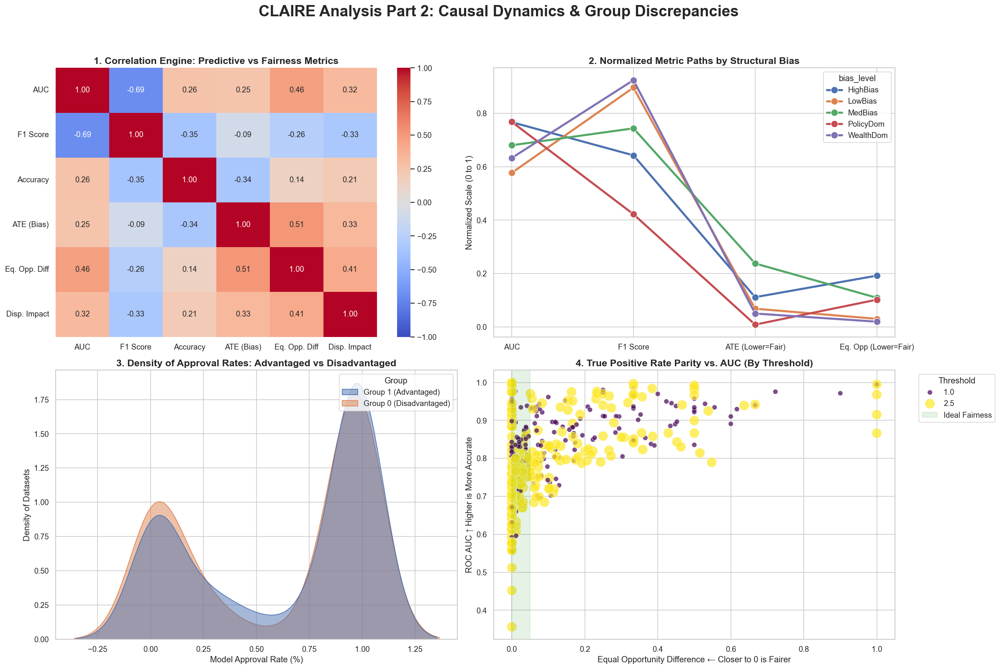

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_claire_data():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    semi_csv = "CLAIRE_semi_syn_results.csv"
    
    if not os.path.exists(semi_csv):
        raise FileNotFoundError(f"Could not find {semi_csv} in the current directory.")
        
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    # CLAIRE frequently generates 'inf' if it strictly predicts 0 positives for the disadvantaged group
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists (using our extraction logic if it wasn't saved)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if len(x.split('_')) > 2 else 'Unknown')
         
    return df_semi

def plot_claire_part2_dashboard():
    df_semi = load_and_clean_claire_data()
    
    # Create a 2x2 grid for our dynamic analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CLAIRE Analysis Part 2: Causal Dynamics & Group Discrepancies', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Metric Correlation Heatmap
    # Explains: Do Predictive Power and Fairness inherently conflict?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    cols_to_correlate = [
        'ROC_AUC', 'F1_Score', 'Accuracy', 
        'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff', 'Disparate_Impact_Ratio'
    ]
    # Calculate Pearson Correlation
    corr_matrix = df_semi[cols_to_correlate].corr()
    
    # Custom labels for cleaner presentation
    labels = ['AUC', 'F1 Score', 'Accuracy', 'ATE (Bias)', 'Eq. Opp. Diff', 'Disp. Impact']
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
                xticklabels=labels, yticklabels=labels, ax=ax1, vmin=-1, vmax=1)
    ax1.set_title('1. Correlation Engine: Predictive vs Fairness Metrics', fontsize=14, fontweight='bold')

    # ---------------------------------------------------------
    # GRAPH 2: Parallel Coordinates (Average Paths by Bias Level)
    # Explains: How does a dataset's bias level shift all metrics simultaneously?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    
    # Select key metrics to trace
    trace_cols = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    # Normalize the data (0 to 1) so AUC (usually 0.5-1.0) and ATE (0.0-0.3) can be plotted on the same Y-axis
    scaler = MinMaxScaler()
    df_norm = df_semi.copy()
    df_norm[trace_cols] = scaler.fit_transform(df_norm[trace_cols])
    
    # Melt the dataframe for Seaborn lineplot compatibility
    df_melted = df_norm.melt(id_vars=['bias_level'], value_vars=trace_cols, 
                             var_name='Metric', value_name='Normalized Score')
    
    # Plot the average path for each bias level
    sns.lineplot(data=df_melted, x='Metric', y='Normalized Score', hue='bias_level', 
                 estimator='mean', errorbar=None, marker='o', linewidth=3, markersize=10, ax=ax2)
    
    # Clean up the X-axis labels
    ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])
    ax2.set_title('2. Normalized Metric Paths by Structural Bias', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Normalized Scale (0 to 1)')
    ax2.set_xlabel('')

    # ---------------------------------------------------------
    # GRAPH 3: Positive Rate Discrepancy (Group 1 vs Group 0)
    # Explains: HOW is the model discriminating?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    
    # Melt the positive rates to plot them side-by-side as a density distribution
    df_rates = df_semi.melt(id_vars=['bias_level'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                            var_name='Group', value_name='Approval Rate')
    df_rates['Group'] = df_rates['Group'].replace({'Pos_Rate_S1': 'Group 1 (Advantaged)', 'Pos_Rate_S0': 'Group 0 (Disadvantaged)'})
    
    sns.kdeplot(data=df_rates, x='Approval Rate', hue='Group', fill=True, common_norm=False, alpha=0.5, ax=ax3)
    ax3.set_title('3. Density of Approval Rates: Advantaged vs Disadvantaged', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Model Approval Rate (%)')
    ax3.set_ylabel('Density of Datasets')

    # ---------------------------------------------------------
    # GRAPH 4: Equal Opportunity vs AUC faceted by Threshold
    # Explains: Does the strictness of the decision threshold break fairness?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Scatter plot tracking Eq Opp vs AUC, using threshold for size/color to spot clusters
    sns.scatterplot(
        data=df_semi, 
        x='Equal_Opportunity_Diff', 
        y='ROC_AUC', 
        hue='threshold', 
        size='threshold',
        sizes=(50, 200),
        alpha=0.7,
        palette='viridis',
        ax=ax4
    )
    ax4.set_title('4. True Positive Rate Parity vs. AUC (By Threshold)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Equal Opportunity Difference \u2190 Closer to 0 is Fairer')
    ax4.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    
    # Highlight Ideal Zone
    ax4.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness')
    handles, labels = ax4.get_legend_handles_labels()
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Threshold")

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_claire_part2_dashboard()

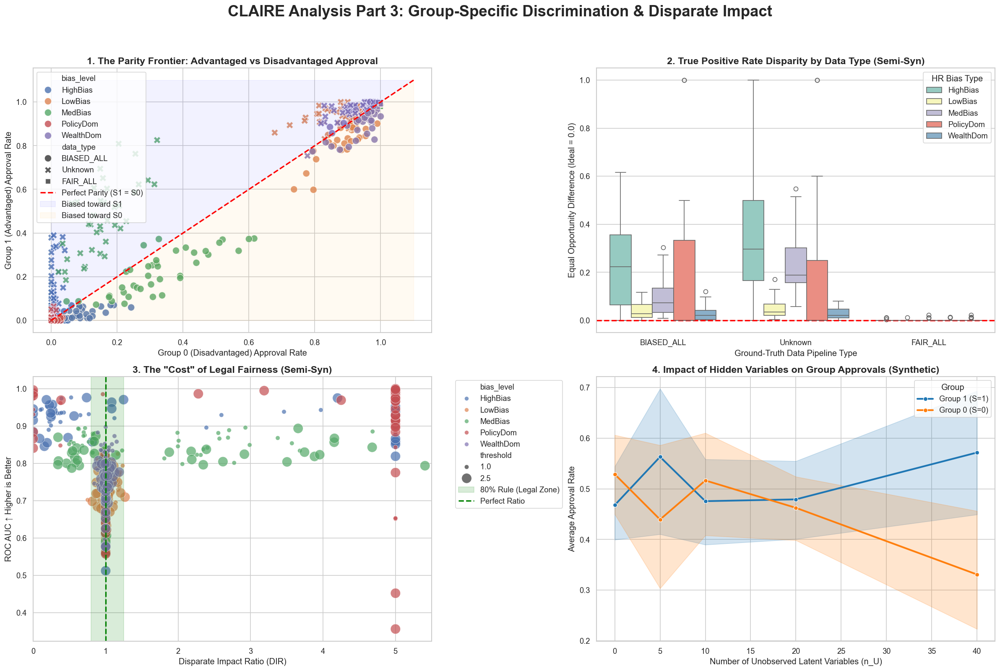

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_claire_data():
    """Loads both CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "CLAIRE_syn_results.csv"
    semi_csv = "CLAIRE_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the CLAIRE results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to 5.0 for visualization
    # (CLAIRE often hits infinity when Pos_Rate_S0 is exactly 0.0)
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if len(x.split('_')) > 2 else 'Unknown')
         
    return df_syn, df_semi

def plot_claire_part3_dashboard():
    df_syn, df_semi = load_and_clean_claire_data()
    
    # Create a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CLAIRE Analysis Part 3: Group-Specific Discrimination & Disparate Impact', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: The Parity Frontier (S1 vs S0 Positivity Rates)
    # Explains: Is the model systematically favoring one group over the other?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Pos_Rate_S0', 
        y='Pos_Rate_S1', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    # Draw the Line of Perfect Parity (y=x)
    max_val = max(df_semi['Pos_Rate_S0'].max(), df_semi['Pos_Rate_S1'].max()) + 0.1
    ax1.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Parity (S1 = S0)')
    
    # Fill areas to show bias direction
    ax1.fill_between([0, max_val], [0, max_val], max_val, color='blue', alpha=0.05, label='Biased toward S1')
    ax1.fill_between([0, max_val], 0, [0, max_val], color='orange', alpha=0.05, label='Biased toward S0')
    
    ax1.set_title('1. The Parity Frontier: Advantaged vs Disadvantaged Approval', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Group 0 (Disadvantaged) Approval Rate')
    ax1.set_ylabel('Group 1 (Advantaged) Approval Rate')
    ax1.legend(loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 2: Equal Opportunity Difference by Data Type
    # Explains: Does supplying perfectly FAIR labels fix TPR disparity?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='data_type', 
        y='Equal_Opportunity_Diff', 
        hue='bias_level',
        ax=ax2,
        palette='Set3'
    )
    ax2.set_title('2. True Positive Rate Disparity by Data Type (Semi-Syn)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Ground-Truth Data Pipeline Type')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.legend(title='HR Bias Type', loc='upper right')

    # ---------------------------------------------------------
    # GRAPH 3: Disparate Impact vs. Accuracy
    # Explains: What is the predictive cost of achieving legal fairness?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Disparate_Impact_Ratio', 
        y='ROC_AUC', 
        hue='bias_level',
        size='threshold',
        sizes=(40, 200),
        alpha=0.7,
        ax=ax3
    )
    ax3.set_title('3. The "Cost" of Legal Fairness (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Disparate Impact Ratio (DIR)')
    ax3.set_ylabel('ROC AUC \u2191 Higher is Better')
    
    # The 80% Rule (Four-Fifths Rule) typically defines legally acceptable DIR between 0.8 and 1.25
    ax3.axvspan(0.8, 1.25, color='green', alpha=0.15, label='80% Rule (Legal Zone)')
    ax3.axvline(1.0, color='green', linestyle='--', linewidth=2, label='Perfect Ratio')
    # Extend X limit to 5.5 so we can see the datasets that CLAIRE pushed to "Infinity" (capped at 5.0)
    ax3.set_xlim(0, 5.5) 
    
    # Fix legend
    handles, labels = ax3.get_legend_handles_labels()
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 4: Latent Variables vs. Group Approval Rates (Synthetic)
    # Explains: As U increases, do the groups diverge?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Melt the synthetic data to plot both S1 and S0 rates on the same axis over n_U
    df_syn_melt = df_syn.melt(id_vars=['n_U'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                              var_name='Group', value_name='Approval Rate')
    
    df_syn_melt['Group'] = df_syn_melt['Group'].replace({'Pos_Rate_S1': 'Group 1 (S=1)', 'Pos_Rate_S0': 'Group 0 (S=0)'})
    
    sns.lineplot(
        data=df_syn_melt, 
        x='n_U', 
        y='Approval Rate', 
        hue='Group',
        marker='o',
        linewidth=2.5,
        palette=['#1f77b4', '#ff7f0e'],
        ax=ax4,
        errorbar='ci'
    )
    ax4.set_title('4. Impact of Hidden Variables on Group Approvals (Synthetic)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax4.set_ylabel('Average Approval Rate')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_claire_part3_dashboard()

# SRCVAE

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\4050191508.py:63: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
C:\Users\patri\AppData\Local\Temp\ipykernel_5448\4050191508.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


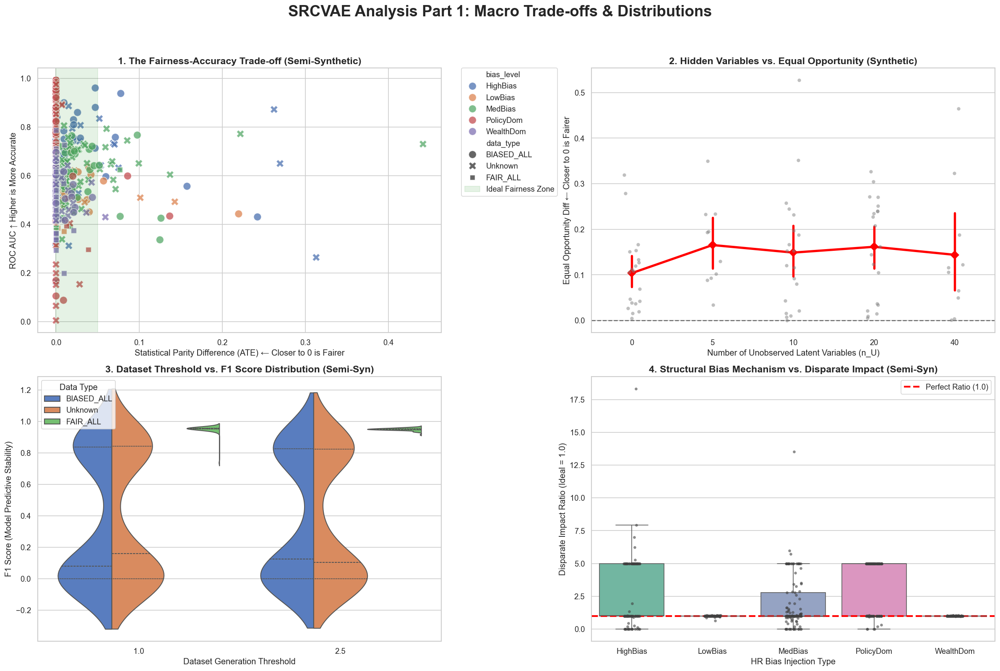

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_srcvae_data():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "SRCVAE_syn_results.csv"
    semi_csv = "SRCVAE_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the SRCVAE results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    return df_syn, df_semi

def plot_srcvae_part1_dashboard():
    df_syn, df_semi = load_and_clean_srcvae_data()
    
    # Create a 2x2 grid for our macro-analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('SRCVAE Analysis Part 1: Macro Trade-offs & Distributions', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Global Trade-off (AUC vs ATE) by Bias Level
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level', 
        style='data_type',
        s=120, alpha=0.75, ax=ax1
    )
    ax1.set_title('1. The Fairness-Accuracy Trade-off (Semi-Synthetic)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Statistical Parity Difference (ATE) \u2190 Closer to 0 is Fairer')
    ax1.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # ---------------------------------------------------------
    # GRAPH 2: Impact of Latent Variables (n_U) on Equal Opportunity
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    # We use a strip plot overlaid with a point plot to see individual variance + the trend
    sns.stripplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', alpha=0.5, color='gray', ax=ax2)
    sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
    ax2.set_title('2. Hidden Variables vs. Equal Opportunity (Synthetic)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax2.set_ylabel('Equal Opportunity Diff \u2190 Closer to 0 is Fairer')
    ax2.axhline(0, color='black', linestyle='--', alpha=0.5)

    # ---------------------------------------------------------
    # GRAPH 3: Decision Threshold vs. Predictive Stability
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    # Violin plots show the exact density/distribution of F1 scores across thresholds
    sns.violinplot(
        data=df_semi, 
        x='threshold', 
        y='F1_Score', 
        hue='data_type',
        split=True, # Splits the violin to compare BIASED vs FAIR datasets directly
        inner="quart",
        ax=ax3,
        palette="muted"
    )
    ax3.set_title('3. Dataset Threshold vs. F1 Score Distribution (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Dataset Generation Threshold')
    ax3.set_ylabel('F1 Score (Model Predictive Stability)')
    ax3.legend(title='Data Type')

    # ---------------------------------------------------------
    # GRAPH 4: Bias Level vs. Disparate Impact Ratio
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_semi, 
        x='bias_level', 
        y='Disparate_Impact_Ratio', 
        palette='Set2',
        showfliers=False, # Hide massive outliers to see the interquartile range clearly
        ax=ax4
    )
    # Add jittered points on top of the boxplot to see the exact spread of datasets
    sns.stripplot(data=df_semi, x='bias_level', y='Disparate_Impact_Ratio', color=".25", alpha=0.6, size=4, ax=ax4)
    ax4.set_title('4. Structural Bias Mechanism vs. Disparate Impact (Semi-Syn)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('HR Bias Injection Type')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2.5, label='Perfect Ratio (1.0)')
    ax4.legend()

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_srcvae_part1_dashboard()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\1759754926.py:81: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])


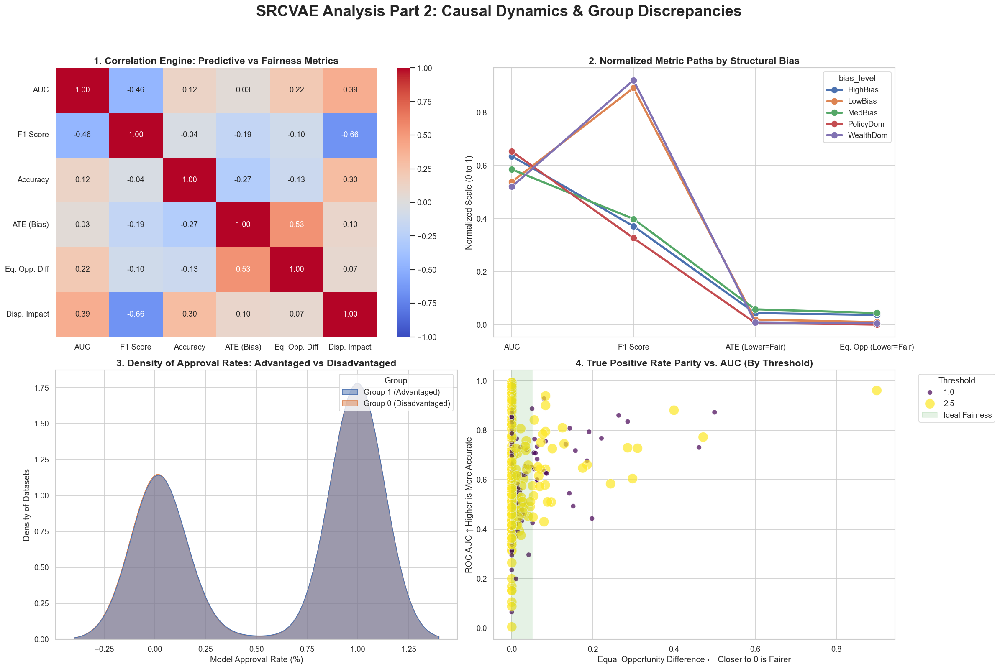

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_srcvae_data_p2():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    semi_csv = "SRCVAE_semi_syn_results.csv"
    
    if not os.path.exists(semi_csv):
        raise FileNotFoundError(f"Could not find {semi_csv} in the current directory.")
        
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists (using our extraction logic if it wasn't saved)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown')
         
    return df_semi

def plot_srcvae_part2_dashboard():
    df_semi = load_and_clean_srcvae_data_p2()
    
    # Create a 2x2 grid for our dynamic analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('SRCVAE Analysis Part 2: Causal Dynamics & Group Discrepancies', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Metric Correlation Heatmap
    # Explains: Do Predictive Power and Fairness inherently conflict?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    cols_to_correlate = [
        'ROC_AUC', 'F1_Score', 'Accuracy', 
        'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff', 'Disparate_Impact_Ratio'
    ]
    # Calculate Pearson Correlation
    corr_matrix = df_semi[cols_to_correlate].corr()
    
    # Custom labels for cleaner presentation
    labels = ['AUC', 'F1 Score', 'Accuracy', 'ATE (Bias)', 'Eq. Opp. Diff', 'Disp. Impact']
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
                xticklabels=labels, yticklabels=labels, ax=ax1, vmin=-1, vmax=1)
    ax1.set_title('1. Correlation Engine: Predictive vs Fairness Metrics', fontsize=14, fontweight='bold')

    # ---------------------------------------------------------
    # GRAPH 2: Parallel Coordinates (Average Paths by Bias Level)
    # Explains: How does a dataset's bias level shift all metrics simultaneously?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    
    # Select key metrics to trace
    trace_cols = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    # Normalize the data (0 to 1) so AUC (usually 0.5-1.0) and ATE (0.0-0.3) can be plotted on the same Y-axis
    scaler = MinMaxScaler()
    df_norm = df_semi.copy()
    df_norm[trace_cols] = scaler.fit_transform(df_norm[trace_cols])
    
    # Melt the dataframe for Seaborn lineplot compatibility
    df_melted = df_norm.melt(id_vars=['bias_level'], value_vars=trace_cols, 
                             var_name='Metric', value_name='Normalized Score')
    
    # Plot the average path for each bias level
    sns.lineplot(data=df_melted, x='Metric', y='Normalized Score', hue='bias_level', 
                 estimator='mean', errorbar=None, marker='o', linewidth=3, markersize=10, ax=ax2)
    
    # Clean up the X-axis labels
    ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])
    ax2.set_title('2. Normalized Metric Paths by Structural Bias', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Normalized Scale (0 to 1)')
    ax2.set_xlabel('')

    # ---------------------------------------------------------
    # GRAPH 3: Positive Rate Discrepancy (Group 1 vs Group 0)
    # Explains: HOW is the model discriminating?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    
    # Melt the positive rates to plot them side-by-side as a density distribution
    df_rates = df_semi.melt(id_vars=['bias_level'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                            var_name='Group', value_name='Approval Rate')
    df_rates['Group'] = df_rates['Group'].replace({'Pos_Rate_S1': 'Group 1 (Advantaged)', 'Pos_Rate_S0': 'Group 0 (Disadvantaged)'})
    
    sns.kdeplot(data=df_rates, x='Approval Rate', hue='Group', fill=True, common_norm=False, alpha=0.5, ax=ax3)
    ax3.set_title('3. Density of Approval Rates: Advantaged vs Disadvantaged', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Model Approval Rate (%)')
    ax3.set_ylabel('Density of Datasets')

    # ---------------------------------------------------------
    # GRAPH 4: Equal Opportunity vs AUC faceted by Threshold
    # Explains: Does the strictness of the decision threshold break fairness?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Scatter plot tracking Eq Opp vs AUC, using threshold for size/color to spot clusters
    sns.scatterplot(
        data=df_semi, 
        x='Equal_Opportunity_Diff', 
        y='ROC_AUC', 
        hue='threshold', 
        size='threshold',
        sizes=(50, 200),
        alpha=0.7,
        palette='viridis',
        ax=ax4
    )
    ax4.set_title('4. True Positive Rate Parity vs. AUC (By Threshold)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Equal Opportunity Difference \u2190 Closer to 0 is Fairer')
    ax4.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    
    # Highlight Ideal Zone
    ax4.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness')
    handles, labels = ax4.get_legend_handles_labels()
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Threshold")

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_srcvae_part2_dashboard()

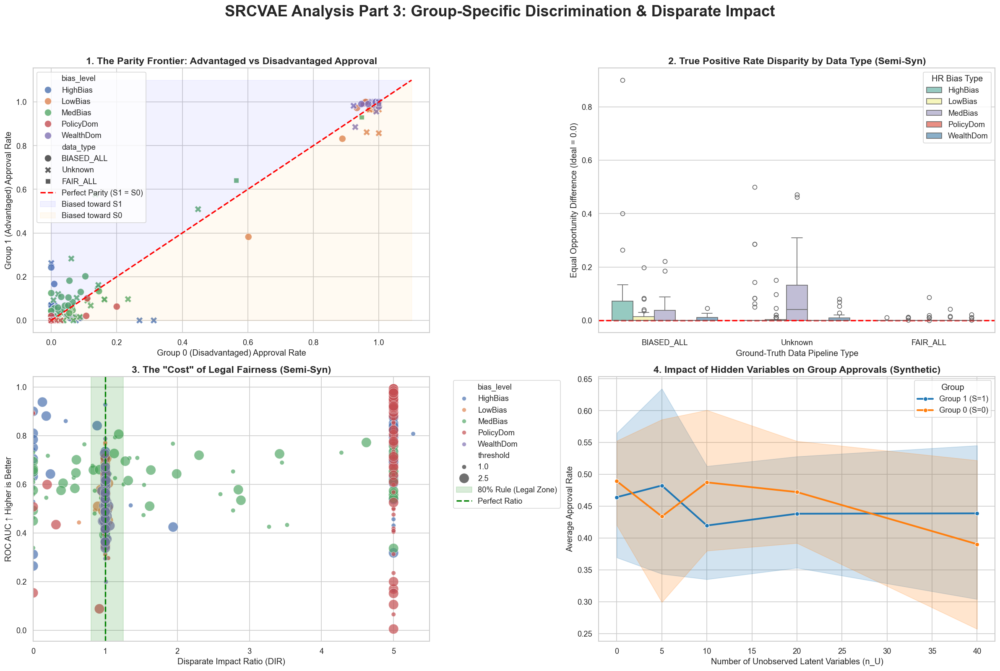

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_srcvae_data_p3():
    """Loads both CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "SRCVAE_syn_results.csv"
    semi_csv = "SRCVAE_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the SRCVAE results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to 5.0 for visualization
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown')
         
    return df_syn, df_semi

def plot_srcvae_part3_dashboard():
    df_syn, df_semi = load_and_clean_srcvae_data_p3()
    
    # Create a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('SRCVAE Analysis Part 3: Group-Specific Discrimination & Disparate Impact', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: The Parity Frontier (S1 vs S0 Positivity Rates)
    # Explains: Is the model systematically favoring one group over the other?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Pos_Rate_S0', 
        y='Pos_Rate_S1', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    # Draw the Line of Perfect Parity (y=x)
    max_val = max(df_semi['Pos_Rate_S0'].max(), df_semi['Pos_Rate_S1'].max()) + 0.1
    ax1.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Parity (S1 = S0)')
    
    # Fill areas to show bias direction
    ax1.fill_between([0, max_val], [0, max_val], max_val, color='blue', alpha=0.05, label='Biased toward S1')
    ax1.fill_between([0, max_val], 0, [0, max_val], color='orange', alpha=0.05, label='Biased toward S0')
    
    ax1.set_title('1. The Parity Frontier: Advantaged vs Disadvantaged Approval', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Group 0 (Disadvantaged) Approval Rate')
    ax1.set_ylabel('Group 1 (Advantaged) Approval Rate')
    ax1.legend(loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 2: Equal Opportunity Difference by Data Type
    # Explains: Does supplying perfectly FAIR labels fix TPR disparity?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='data_type', 
        y='Equal_Opportunity_Diff', 
        hue='bias_level',
        ax=ax2,
        palette='Set3'
    )
    ax2.set_title('2. True Positive Rate Disparity by Data Type (Semi-Syn)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Ground-Truth Data Pipeline Type')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.legend(title='HR Bias Type', loc='upper right')

    # ---------------------------------------------------------
    # GRAPH 3: Disparate Impact vs. Accuracy
    # Explains: What is the predictive cost of achieving legal fairness?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Disparate_Impact_Ratio', 
        y='ROC_AUC', 
        hue='bias_level',
        size='threshold',
        sizes=(40, 200),
        alpha=0.7,
        ax=ax3
    )
    ax3.set_title('3. The "Cost" of Legal Fairness (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Disparate Impact Ratio (DIR)')
    ax3.set_ylabel('ROC AUC \u2191 Higher is Better')
    
    # The 80% Rule (Four-Fifths Rule) typically defines legally acceptable DIR between 0.8 and 1.25
    ax3.axvspan(0.8, 1.25, color='green', alpha=0.15, label='80% Rule (Legal Zone)')
    ax3.axvline(1.0, color='green', linestyle='--', linewidth=2, label='Perfect Ratio')
    # Extend X limit to 5.5 so we can see the datasets that pushed to "Infinity" (capped at 5.0)
    ax3.set_xlim(0, 5.5) 
    
    # Fix legend
    handles, labels = ax3.get_legend_handles_labels()
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 4: Latent Variables vs. Group Approval Rates (Synthetic)
    # Explains: As U increases, do the groups diverge?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Melt the synthetic data to plot both S1 and S0 rates on the same axis over n_U
    df_syn_melt = df_syn.melt(id_vars=['n_U'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                              var_name='Group', value_name='Approval Rate')
    
    df_syn_melt['Group'] = df_syn_melt['Group'].replace({'Pos_Rate_S1': 'Group 1 (S=1)', 'Pos_Rate_S0': 'Group 0 (S=0)'})
    
    sns.lineplot(
        data=df_syn_melt, 
        x='n_U', 
        y='Approval Rate', 
        hue='Group',
        marker='o',
        linewidth=2.5,
        palette=['#1f77b4', '#ff7f0e'],
        ax=ax4,
        errorbar='ci'
    )
    ax4.set_title('4. Impact of Hidden Variables on Group Approvals (Synthetic)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax4.set_ylabel('Average Approval Rate')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_srcvae_part3_dashboard()

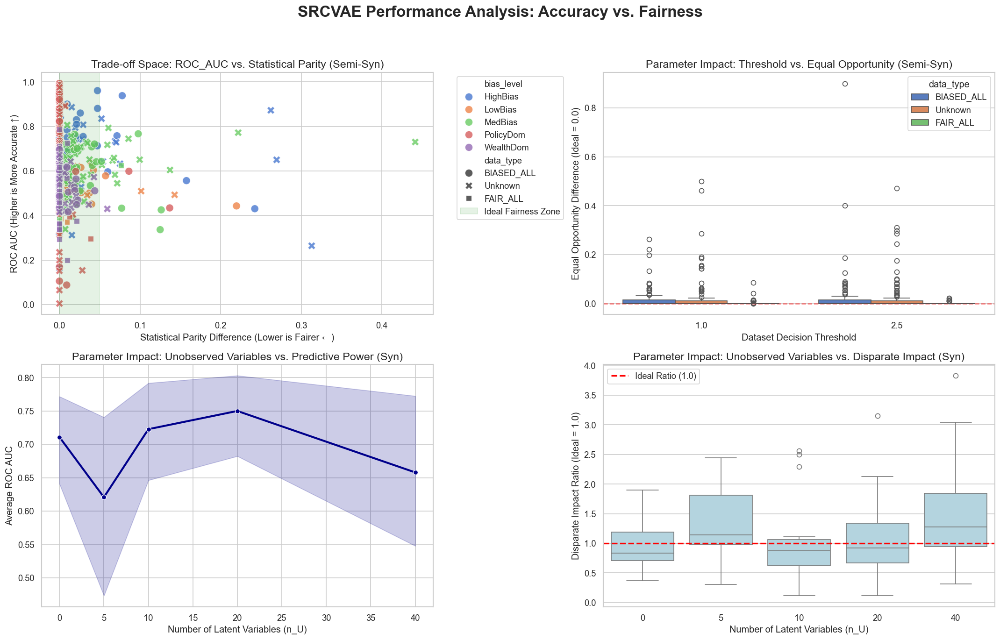

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set global seaborn styling for publication-quality plots
sns.set_theme(style="whitegrid", palette="muted")

def analyze_srcvae_results(syn_csv="SRCVAE_syn_results.csv", semi_syn_csv="SRCVAE_semi_syn_results.csv"):
    """
    Loads the SRCVAE results CSVs and generates visualizations explaining 
    the relationship between dataset parameters, predictive accuracy, and fairness.
    """
    
    # 1. Load Data
    if not os.path.exists(semi_syn_csv) or not os.path.exists(syn_csv):
        print("Please ensure the CSV files are in the same directory as this script.")
        return

    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_syn_csv)
    
    # Drop rows where fairness metrics might be NaN (e.g., when no protected attribute was found)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Create a Matplotlib Figure with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('SRCVAE Performance Analysis: Accuracy vs. Fairness', fontsize=20, fontweight='bold')

    # ==============================================================================
    # VIZ 1: The Accuracy-Fairness Trade-off (Semi-Synthetic Data)
    # ==============================================================================
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    ax1.set_title('Trade-off Space: ROC_AUC vs. Statistical Parity (Semi-Syn)', fontsize=14)
    ax1.set_xlabel('Statistical Parity Difference (Lower is Fairer \u2190)')
    ax1.set_ylabel('ROC AUC (Higher is More Accurate \u2191)')
    
    # Highlight the "Ideal Zone" (High Accuracy, High Fairness)
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ==============================================================================
    # VIZ 2: Parameter Impact on Fairness (Semi-Synthetic Data)
    # ==============================================================================
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='threshold', 
        y='Equal_Opportunity_Diff', 
        hue='data_type', 
        ax=ax2
    )
    ax2.set_title('Parameter Impact: Threshold vs. Equal Opportunity (Semi-Syn)', fontsize=14)
    ax2.set_xlabel('Dataset Decision Threshold')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', alpha=0.5)

    # ==============================================================================
    # VIZ 3: Parameter Impact on Predictive Power (Synthetic Data)
    # ==============================================================================
    ax3 = axes[1, 0]
    sns.lineplot(
        data=df_syn, 
        x='n_U', 
        y='ROC_AUC', 
        marker='o',
        linewidth=2.5,
        ax=ax3,
        color='darkblue'
    )
    ax3.set_title('Parameter Impact: Unobserved Variables vs. Predictive Power (Syn)', fontsize=14)
    ax3.set_xlabel('Number of Latent Variables (n_U)')
    ax3.set_ylabel('Average ROC AUC')

    # ==============================================================================
    # VIZ 4: Parameter Impact on Fairness (Synthetic Data)
    # ==============================================================================
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_syn, 
        x='n_U', 
        y='Disparate_Impact_Ratio', 
        ax=ax4,
        color='lightblue'
    )
    ax4.set_title('Parameter Impact: Unobserved Variables vs. Disparate Impact (Syn)', fontsize=14)
    ax4.set_xlabel('Number of Latent Variables (n_U)')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    # Draw a line at the ideal DIR of 1.0
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='Ideal Ratio (1.0)')
    ax4.legend()

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    analyze_srcvae_results()

# CFFair

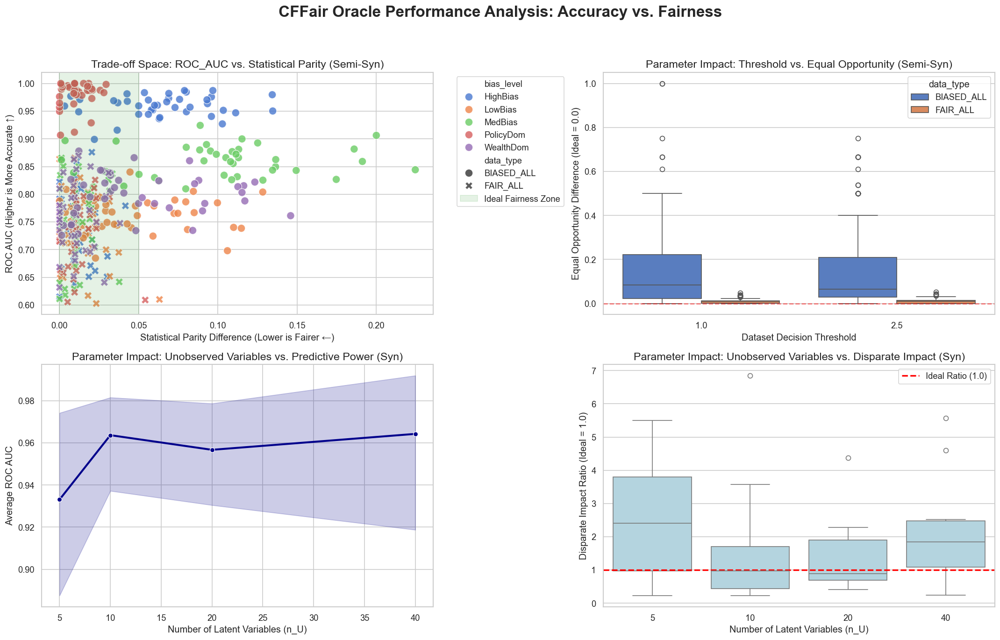

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set global seaborn styling for publication-quality plots
sns.set_theme(style="whitegrid", palette="muted")

def analyze_cffair_results(syn_csv="CFFair_syn_results.csv", semi_syn_csv="CFFair_semi_syn_results.csv"):
    """
    Loads the CFFair Oracle results CSVs and generates visualizations explaining 
    the relationship between dataset parameters, predictive accuracy, and fairness.
    """
    
    # 1. Load Data
    if not os.path.exists(semi_syn_csv) or not os.path.exists(syn_csv):
        print("Please ensure the CSV files are in the same directory as this script.")
        return

    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_syn_csv)
    
    # Drop rows where fairness metrics might be NaN (e.g., when no protected attribute was found)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Create a Matplotlib Figure with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('CFFair Oracle Performance Analysis: Accuracy vs. Fairness', fontsize=20, fontweight='bold')

    # ==============================================================================
    # VIZ 1: The Accuracy-Fairness Trade-off (Semi-Synthetic Data)
    # ==============================================================================
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    ax1.set_title('Trade-off Space: ROC_AUC vs. Statistical Parity (Semi-Syn)', fontsize=14)
    ax1.set_xlabel('Statistical Parity Difference (Lower is Fairer \u2190)')
    ax1.set_ylabel('ROC AUC (Higher is More Accurate \u2191)')
    
    # Highlight the "Ideal Zone" (High Accuracy, High Fairness)
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ==============================================================================
    # VIZ 2: Parameter Impact on Fairness (Semi-Synthetic Data)
    # ==============================================================================
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='threshold', 
        y='Equal_Opportunity_Diff', 
        hue='data_type', 
        ax=ax2
    )
    ax2.set_title('Parameter Impact: Threshold vs. Equal Opportunity (Semi-Syn)', fontsize=14)
    ax2.set_xlabel('Dataset Decision Threshold')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', alpha=0.5)

    # ==============================================================================
    # VIZ 3: Parameter Impact on Predictive Power (Synthetic Data)
    # ==============================================================================
    ax3 = axes[1, 0]
    sns.lineplot(
        data=df_syn, 
        x='n_U', 
        y='ROC_AUC', 
        marker='o',
        linewidth=2.5,
        ax=ax3,
        color='darkblue'
    )
    ax3.set_title('Parameter Impact: Unobserved Variables vs. Predictive Power (Syn)', fontsize=14)
    ax3.set_xlabel('Number of Latent Variables (n_U)')
    ax3.set_ylabel('Average ROC AUC')

    # ==============================================================================
    # VIZ 4: Parameter Impact on Fairness (Synthetic Data)
    # ==============================================================================
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_syn, 
        x='n_U', 
        y='Disparate_Impact_Ratio', 
        ax=ax4,
        color='lightblue'
    )
    ax4.set_title('Parameter Impact: Unobserved Variables vs. Disparate Impact (Syn)', fontsize=14)
    ax4.set_xlabel('Number of Latent Variables (n_U)')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    # Draw a line at the ideal DIR of 1.0
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='Ideal Ratio (1.0)')
    ax4.legend()

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    analyze_cffair_results()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2045099581.py:63: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2045099581.py:93: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


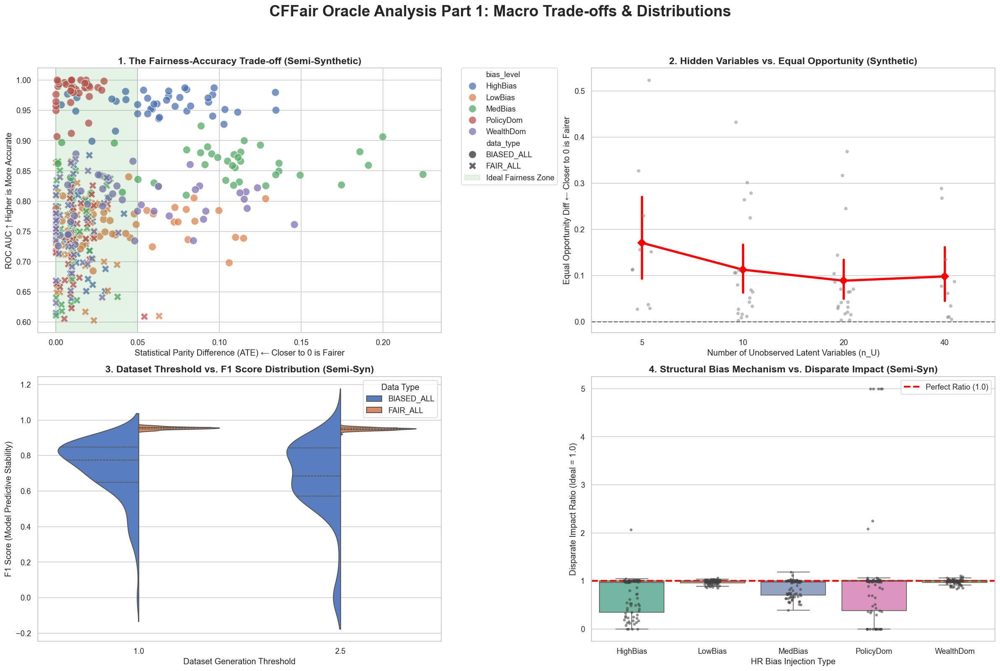

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_cffair_data_p1():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "CFFair_syn_results.csv"
    semi_csv = "CFFair_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the CFFair results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    return df_syn, df_semi

def plot_cffair_part1_dashboard():
    df_syn, df_semi = load_and_clean_cffair_data_p1()
    
    # Create a 2x2 grid for our macro-analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CFFair Oracle Analysis Part 1: Macro Trade-offs & Distributions', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Global Trade-off (AUC vs ATE) by Bias Level
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level', 
        style='data_type',
        s=120, alpha=0.75, ax=ax1
    )
    ax1.set_title('1. The Fairness-Accuracy Trade-off (Semi-Synthetic)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Statistical Parity Difference (ATE) \u2190 Closer to 0 is Fairer')
    ax1.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # ---------------------------------------------------------
    # GRAPH 2: Impact of Latent Variables (n_U) on Equal Opportunity
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    # We use a strip plot overlaid with a point plot to see individual variance + the trend
    sns.stripplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', alpha=0.5, color='gray', ax=ax2)
    sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
    ax2.set_title('2. Hidden Variables vs. Equal Opportunity (Synthetic)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax2.set_ylabel('Equal Opportunity Diff \u2190 Closer to 0 is Fairer')
    ax2.axhline(0, color='black', linestyle='--', alpha=0.5)

    # ---------------------------------------------------------
    # GRAPH 3: Decision Threshold vs. Predictive Stability
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    # Violin plots show the exact density/distribution of F1 scores across thresholds
    sns.violinplot(
        data=df_semi, 
        x='threshold', 
        y='F1_Score', 
        hue='data_type',
        split=True, # Splits the violin to compare BIASED vs FAIR datasets directly
        inner="quart",
        ax=ax3,
        palette="muted"
    )
    ax3.set_title('3. Dataset Threshold vs. F1 Score Distribution (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Dataset Generation Threshold')
    ax3.set_ylabel('F1 Score (Model Predictive Stability)')
    ax3.legend(title='Data Type')

    # ---------------------------------------------------------
    # GRAPH 4: Bias Level vs. Disparate Impact Ratio
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_semi, 
        x='bias_level', 
        y='Disparate_Impact_Ratio', 
        palette='Set2',
        showfliers=False, # Hide massive outliers to see the interquartile range clearly
        ax=ax4
    )
    # Add jittered points on top of the boxplot to see the exact spread of datasets
    sns.stripplot(data=df_semi, x='bias_level', y='Disparate_Impact_Ratio', color=".25", alpha=0.6, size=4, ax=ax4)
    ax4.set_title('4. Structural Bias Mechanism vs. Disparate Impact (Semi-Syn)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('HR Bias Injection Type')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2.5, label='Perfect Ratio (1.0)')
    ax4.legend()

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_cffair_part1_dashboard()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\4168648696.py:83: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])


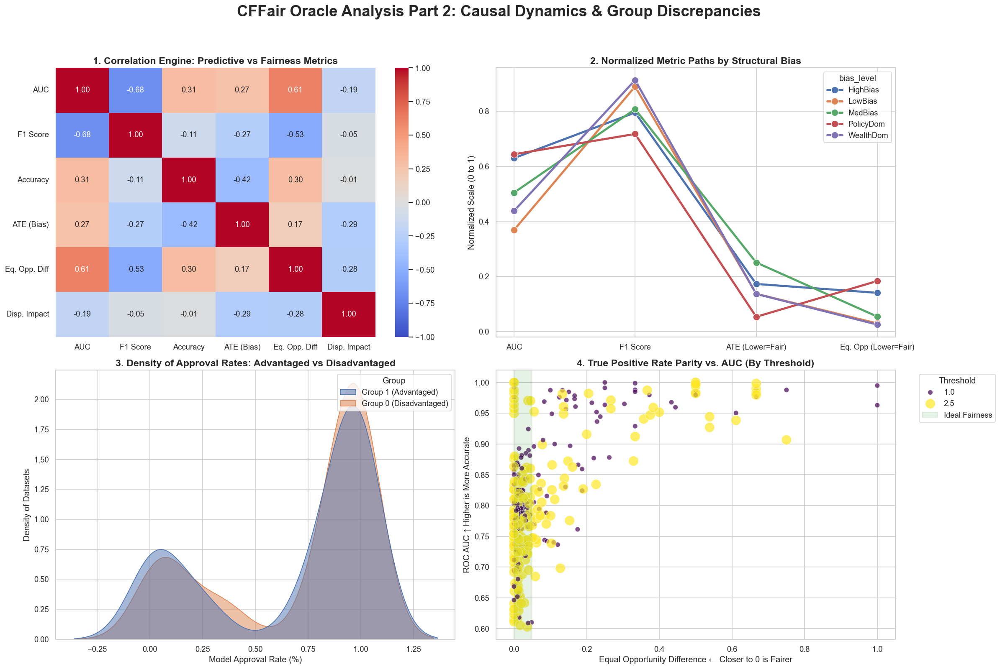

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_cffair_data_p2():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    semi_csv = "CFFair_semi_syn_results.csv"
    
    if not os.path.exists(semi_csv):
        raise FileNotFoundError(f"Could not find {semi_csv} in the current directory.")
        
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists (using our extraction logic if it wasn't saved)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(
             lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
         )
         
    return df_semi

def plot_cffair_part2_dashboard():
    df_semi = load_and_clean_cffair_data_p2()
    
    # Create a 2x2 grid for our dynamic analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CFFair Oracle Analysis Part 2: Causal Dynamics & Group Discrepancies', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Metric Correlation Heatmap
    # Explains: Do Predictive Power and Fairness inherently conflict?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    cols_to_correlate = [
        'ROC_AUC', 'F1_Score', 'Accuracy', 
        'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff', 'Disparate_Impact_Ratio'
    ]
    # Calculate Pearson Correlation
    corr_matrix = df_semi[cols_to_correlate].corr()
    
    # Custom labels for cleaner presentation
    labels = ['AUC', 'F1 Score', 'Accuracy', 'ATE (Bias)', 'Eq. Opp. Diff', 'Disp. Impact']
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
                xticklabels=labels, yticklabels=labels, ax=ax1, vmin=-1, vmax=1)
    ax1.set_title('1. Correlation Engine: Predictive vs Fairness Metrics', fontsize=14, fontweight='bold')

    # ---------------------------------------------------------
    # GRAPH 2: Parallel Coordinates (Average Paths by Bias Level)
    # Explains: How does a dataset's bias level shift all metrics simultaneously?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    
    # Select key metrics to trace
    trace_cols = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    # Normalize the data (0 to 1) so AUC (usually 0.5-1.0) and ATE (0.0-0.3) can be plotted on the same Y-axis
    scaler = MinMaxScaler()
    df_norm = df_semi.copy()
    df_norm[trace_cols] = scaler.fit_transform(df_norm[trace_cols])
    
    # Melt the dataframe for Seaborn lineplot compatibility
    df_melted = df_norm.melt(id_vars=['bias_level'], value_vars=trace_cols, 
                             var_name='Metric', value_name='Normalized Score')
    
    # Plot the average path for each bias level
    sns.lineplot(data=df_melted, x='Metric', y='Normalized Score', hue='bias_level', 
                 estimator='mean', errorbar=None, marker='o', linewidth=3, markersize=10, ax=ax2)
    
    # Clean up the X-axis labels
    ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])
    ax2.set_title('2. Normalized Metric Paths by Structural Bias', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Normalized Scale (0 to 1)')
    ax2.set_xlabel('')

    # ---------------------------------------------------------
    # GRAPH 3: Positive Rate Discrepancy (Group 1 vs Group 0)
    # Explains: HOW is the model discriminating?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    
    # Melt the positive rates to plot them side-by-side as a density distribution
    df_rates = df_semi.melt(id_vars=['bias_level'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                            var_name='Group', value_name='Approval Rate')
    df_rates['Group'] = df_rates['Group'].replace({'Pos_Rate_S1': 'Group 1 (Advantaged)', 'Pos_Rate_S0': 'Group 0 (Disadvantaged)'})
    
    sns.kdeplot(data=df_rates, x='Approval Rate', hue='Group', fill=True, common_norm=False, alpha=0.5, ax=ax3)
    ax3.set_title('3. Density of Approval Rates: Advantaged vs Disadvantaged', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Model Approval Rate (%)')
    ax3.set_ylabel('Density of Datasets')

    # ---------------------------------------------------------
    # GRAPH 4: Equal Opportunity vs AUC faceted by Threshold
    # Explains: Does the strictness of the decision threshold break fairness?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Scatter plot tracking Eq Opp vs AUC, using threshold for size/color to spot clusters
    sns.scatterplot(
        data=df_semi, 
        x='Equal_Opportunity_Diff', 
        y='ROC_AUC', 
        hue='threshold', 
        size='threshold',
        sizes=(50, 200),
        alpha=0.7,
        palette='viridis',
        ax=ax4
    )
    ax4.set_title('4. True Positive Rate Parity vs. AUC (By Threshold)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Equal Opportunity Difference \u2190 Closer to 0 is Fairer')
    ax4.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    
    # Highlight Ideal Zone
    ax4.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness')
    handles, labels = ax4.get_legend_handles_labels()
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Threshold")

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_cffair_part2_dashboard()

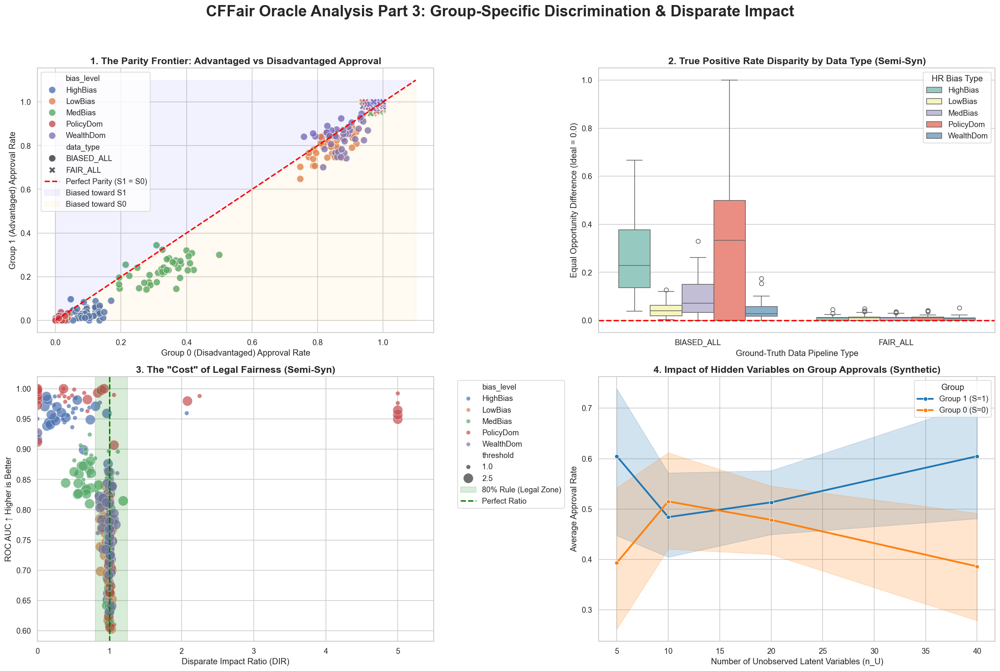

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_cffair_data_p3():
    """Loads both CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "CFFair_syn_results.csv"
    semi_csv = "CFFair_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the CFFair results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to 5.0 for visualization
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(
             lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
         )
         
    return df_syn, df_semi

def plot_cffair_part3_dashboard():
    df_syn, df_semi = load_and_clean_cffair_data_p3()
    
    # Create a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('CFFair Oracle Analysis Part 3: Group-Specific Discrimination & Disparate Impact', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: The Parity Frontier (S1 vs S0 Positivity Rates)
    # Explains: Is the model systematically favoring one group over the other?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Pos_Rate_S0', 
        y='Pos_Rate_S1', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    # Draw the Line of Perfect Parity (y=x)
    max_val = max(df_semi['Pos_Rate_S0'].max(), df_semi['Pos_Rate_S1'].max()) + 0.1
    ax1.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Parity (S1 = S0)')
    
    # Fill areas to show bias direction
    ax1.fill_between([0, max_val], [0, max_val], max_val, color='blue', alpha=0.05, label='Biased toward S1')
    ax1.fill_between([0, max_val], 0, [0, max_val], color='orange', alpha=0.05, label='Biased toward S0')
    
    ax1.set_title('1. The Parity Frontier: Advantaged vs Disadvantaged Approval', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Group 0 (Disadvantaged) Approval Rate')
    ax1.set_ylabel('Group 1 (Advantaged) Approval Rate')
    ax1.legend(loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 2: Equal Opportunity Difference by Data Type
    # Explains: Does supplying perfectly FAIR labels fix TPR disparity?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='data_type', 
        y='Equal_Opportunity_Diff', 
        hue='bias_level',
        ax=ax2,
        palette='Set3'
    )
    ax2.set_title('2. True Positive Rate Disparity by Data Type (Semi-Syn)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Ground-Truth Data Pipeline Type')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.legend(title='HR Bias Type', loc='upper right')

    # ---------------------------------------------------------
    # GRAPH 3: Disparate Impact vs. Accuracy
    # Explains: What is the predictive cost of achieving legal fairness?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Disparate_Impact_Ratio', 
        y='ROC_AUC', 
        hue='bias_level',
        size='threshold',
        sizes=(40, 200),
        alpha=0.7,
        ax=ax3
    )
    ax3.set_title('3. The "Cost" of Legal Fairness (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Disparate Impact Ratio (DIR)')
    ax3.set_ylabel('ROC AUC \u2191 Higher is Better')
    
    # The 80% Rule (Four-Fifths Rule) typically defines legally acceptable DIR between 0.8 and 1.25
    ax3.axvspan(0.8, 1.25, color='green', alpha=0.15, label='80% Rule (Legal Zone)')
    ax3.axvline(1.0, color='green', linestyle='--', linewidth=2, label='Perfect Ratio')
    # Limit extended to 5.5 to catch any "inf" values capped at 5.0
    ax3.set_xlim(0, 5.5) 
    
    # Fix legend
    handles, labels = ax3.get_legend_handles_labels()
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 4: Latent Variables vs. Group Approval Rates (Synthetic)
    # Explains: As U increases, do the groups diverge?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Melt the synthetic data to plot both S1 and S0 rates on the same axis over n_U
    df_syn_melt = df_syn.melt(id_vars=['n_U'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                              var_name='Group', value_name='Approval Rate')
    
    df_syn_melt['Group'] = df_syn_melt['Group'].replace({'Pos_Rate_S1': 'Group 1 (S=1)', 'Pos_Rate_S0': 'Group 0 (S=0)'})
    
    sns.lineplot(
        data=df_syn_melt, 
        x='n_U', 
        y='Approval Rate', 
        hue='Group',
        marker='o',
        linewidth=2.5,
        palette=['#1f77b4', '#ff7f0e'],
        ax=ax4,
        errorbar='ci'
    )
    ax4.set_title('4. Impact of Hidden Variables on Group Approvals (Synthetic)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax4.set_ylabel('Average Approval Rate')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_cffair_part3_dashboard()

# XGB

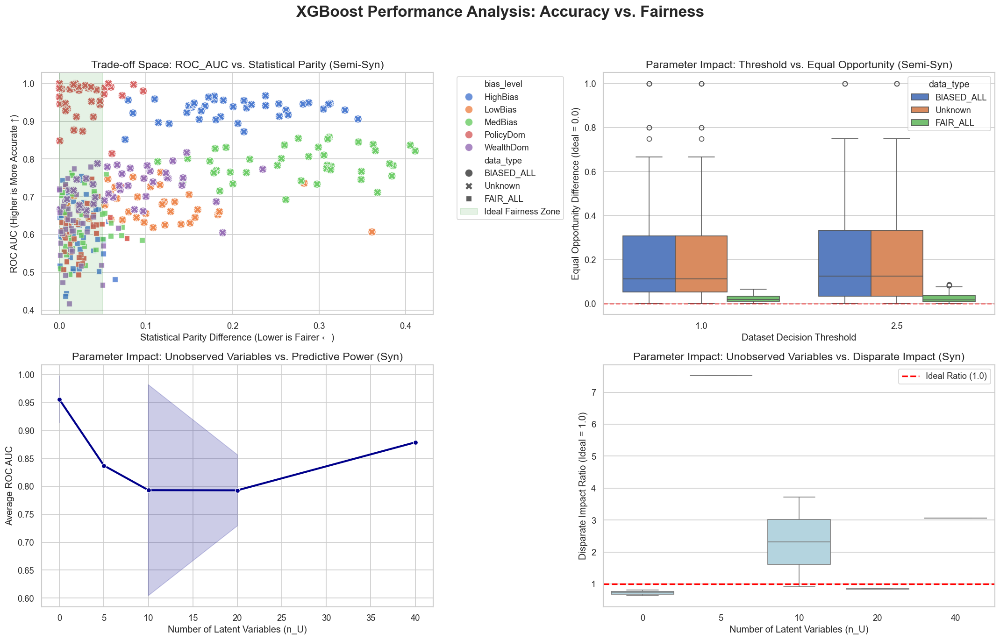

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set global seaborn styling for publication-quality plots
sns.set_theme(style="whitegrid", palette="muted")

def analyze_xgb_results(syn_csv="xgb_syn_results.csv", semi_syn_csv="xgb_semi_syn_results.csv"):
    """
    Loads the XGBoost results CSVs and generates visualizations explaining 
    the relationship between dataset parameters, predictive accuracy, and fairness.
    """
    
    # 1. Load Data
    if not os.path.exists(semi_syn_csv) or not os.path.exists(syn_csv):
        print("Please ensure the CSV files are in the same directory as this script.")
        return

    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_syn_csv)
    
    # Drop rows where fairness metrics might be NaN (e.g., when no protected attribute was found)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Create a Matplotlib Figure with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    fig.suptitle('XGBoost Performance Analysis: Accuracy vs. Fairness', fontsize=20, fontweight='bold')

    # ==============================================================================
    # VIZ 1: The Accuracy-Fairness Trade-off (Semi-Synthetic Data)
    # ==============================================================================
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    ax1.set_title('Trade-off Space: ROC_AUC vs. Statistical Parity (Semi-Syn)', fontsize=14)
    ax1.set_xlabel('Statistical Parity Difference (Lower is Fairer \u2190)')
    ax1.set_ylabel('ROC AUC (Higher is More Accurate \u2191)')
    
    # Highlight the "Ideal Zone" (High Accuracy, High Fairness)
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ==============================================================================
    # VIZ 2: Parameter Impact on Fairness (Semi-Synthetic Data)
    # ==============================================================================
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='threshold', 
        y='Equal_Opportunity_Diff', 
        hue='data_type', 
        ax=ax2
    )
    ax2.set_title('Parameter Impact: Threshold vs. Equal Opportunity (Semi-Syn)', fontsize=14)
    ax2.set_xlabel('Dataset Decision Threshold')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', alpha=0.5)

    # ==============================================================================
    # VIZ 3: Parameter Impact on Predictive Power (Synthetic Data)
    # ==============================================================================
    ax3 = axes[1, 0]
    sns.lineplot(
        data=df_syn, 
        x='n_U', 
        y='ROC_AUC', 
        marker='o',
        linewidth=2.5,
        ax=ax3,
        color='darkblue'
    )
    ax3.set_title('Parameter Impact: Unobserved Variables vs. Predictive Power (Syn)', fontsize=14)
    ax3.set_xlabel('Number of Latent Variables (n_U)')
    ax3.set_ylabel('Average ROC AUC')

    # ==============================================================================
    # VIZ 4: Parameter Impact on Fairness (Synthetic Data)
    # ==============================================================================
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_syn, 
        x='n_U', 
        y='Disparate_Impact_Ratio', 
        ax=ax4,
        color='lightblue'
    )
    ax4.set_title('Parameter Impact: Unobserved Variables vs. Disparate Impact (Syn)', fontsize=14)
    ax4.set_xlabel('Number of Latent Variables (n_U)')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    # Draw a line at the ideal DIR of 1.0
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2, label='Ideal Ratio (1.0)')
    ax4.legend()

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    analyze_xgb_results()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2978031176.py:69: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2978031176.py:99: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


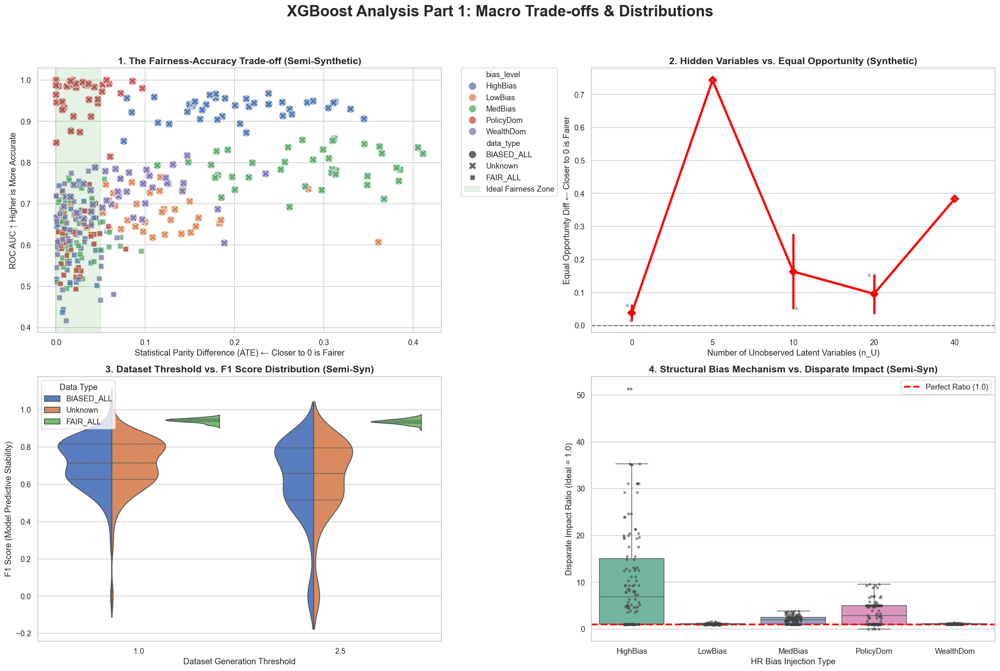

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_xgb_data_p1():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "xgb_syn_results.csv"
    semi_csv = "xgb_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the XGBoost results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn (XGBoost might not have it saved, applying extraction just in case)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(
             lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
         )
    
    return df_syn, df_semi

def plot_xgb_part1_dashboard():
    df_syn, df_semi = load_and_clean_xgb_data_p1()
    
    # Create a 2x2 grid for our macro-analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('XGBoost Analysis Part 1: Macro Trade-offs & Distributions', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Global Trade-off (AUC vs ATE) by Bias Level
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Statistical_Parity_Diff_(ATE)', 
        y='ROC_AUC', 
        hue='bias_level', 
        style='data_type',
        s=120, alpha=0.75, ax=ax1
    )
    ax1.set_title('1. The Fairness-Accuracy Trade-off (Semi-Synthetic)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Statistical Parity Difference (ATE) \u2190 Closer to 0 is Fairer')
    ax1.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    ax1.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness Zone')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # ---------------------------------------------------------
    # GRAPH 2: Impact of Latent Variables (n_U) on Equal Opportunity
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    # We use a strip plot overlaid with a point plot to see individual variance + the trend
    sns.stripplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', alpha=0.5, color='gray', ax=ax2)
    sns.pointplot(data=df_syn, x='n_U', y='Equal_Opportunity_Diff', color='red', markers="D", scale=1.2, ax=ax2, errorbar='ci')
    ax2.set_title('2. Hidden Variables vs. Equal Opportunity (Synthetic)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax2.set_ylabel('Equal Opportunity Diff \u2190 Closer to 0 is Fairer')
    ax2.axhline(0, color='black', linestyle='--', alpha=0.5)

    # ---------------------------------------------------------
    # GRAPH 3: Decision Threshold vs. Predictive Stability
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    # Violin plots show the exact density/distribution of F1 scores across thresholds
    sns.violinplot(
        data=df_semi, 
        x='threshold', 
        y='F1_Score', 
        hue='data_type',
        split=True, # Splits the violin to compare BIASED vs FAIR datasets directly
        inner="quart",
        ax=ax3,
        palette="muted"
    )
    ax3.set_title('3. Dataset Threshold vs. F1 Score Distribution (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Dataset Generation Threshold')
    ax3.set_ylabel('F1 Score (Model Predictive Stability)')
    ax3.legend(title='Data Type')

    # ---------------------------------------------------------
    # GRAPH 4: Bias Level vs. Disparate Impact Ratio
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    sns.boxplot(
        data=df_semi, 
        x='bias_level', 
        y='Disparate_Impact_Ratio', 
        palette='Set2',
        showfliers=False, # Hide massive outliers to see the interquartile range clearly
        ax=ax4
    )
    # Add jittered points on top of the boxplot to see the exact spread of datasets
    sns.stripplot(data=df_semi, x='bias_level', y='Disparate_Impact_Ratio', color=".25", alpha=0.6, size=4, ax=ax4)
    ax4.set_title('4. Structural Bias Mechanism vs. Disparate Impact (Semi-Syn)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('HR Bias Injection Type')
    ax4.set_ylabel('Disparate Impact Ratio (Ideal = 1.0)')
    ax4.axhline(1.0, color='red', linestyle='--', linewidth=2.5, label='Perfect Ratio (1.0)')
    ax4.legend()

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_xgb_part1_dashboard()

C:\Users\patri\AppData\Local\Temp\ipykernel_5448\2415975715.py:83: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])


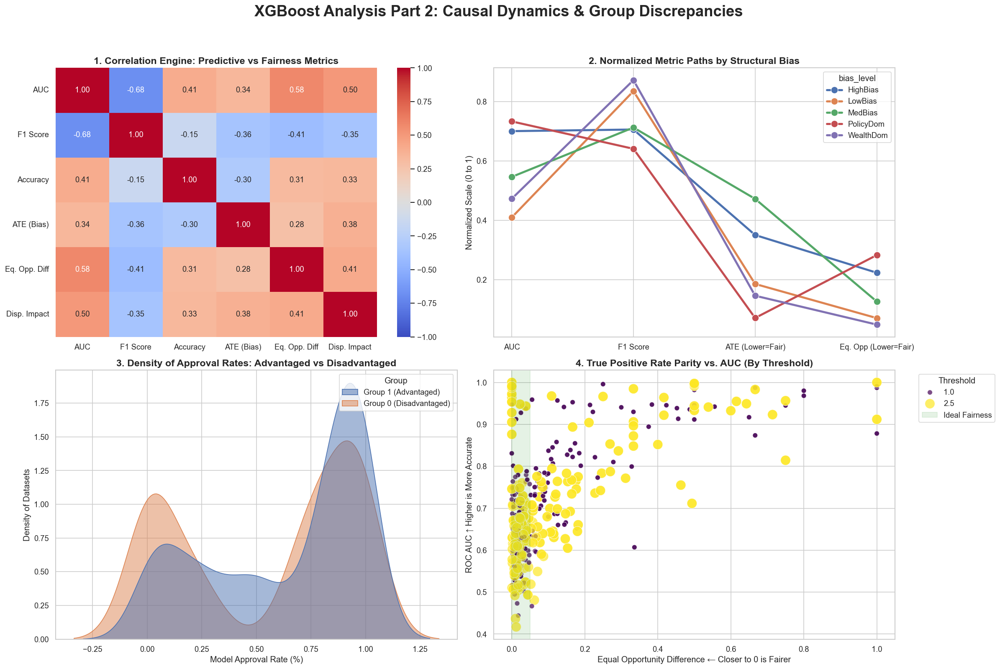

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_xgb_data_p2():
    """Loads CSVs and ensures missing metrics are dropped for accurate plotting."""
    semi_csv = "xgb_semi_syn_results.csv"
    
    if not os.path.exists(semi_csv):
        raise FileNotFoundError(f"Could not find {semi_csv} in the current directory.")
        
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics (e.g., when no protected attribute existed)
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to a high number for visualization purposes
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists (using our extraction logic if it wasn't saved)
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(
             lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
         )
         
    return df_semi

def plot_xgb_part2_dashboard():
    df_semi = load_and_clean_xgb_data_p2()
    
    # Create a 2x2 grid for our dynamic analysis
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('XGBoost Analysis Part 2: Causal Dynamics & Group Discrepancies', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: Metric Correlation Heatmap
    # Explains: Do Predictive Power and Fairness inherently conflict?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    cols_to_correlate = [
        'ROC_AUC', 'F1_Score', 'Accuracy', 
        'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff', 'Disparate_Impact_Ratio'
    ]
    # Calculate Pearson Correlation
    corr_matrix = df_semi[cols_to_correlate].corr()
    
    # Custom labels for cleaner presentation
    labels = ['AUC', 'F1 Score', 'Accuracy', 'ATE (Bias)', 'Eq. Opp. Diff', 'Disp. Impact']
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
                xticklabels=labels, yticklabels=labels, ax=ax1, vmin=-1, vmax=1)
    ax1.set_title('1. Correlation Engine: Predictive vs Fairness Metrics', fontsize=14, fontweight='bold')

    # ---------------------------------------------------------
    # GRAPH 2: Parallel Coordinates (Average Paths by Bias Level)
    # Explains: How does a dataset's bias level shift all metrics simultaneously?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    
    # Select key metrics to trace
    trace_cols = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    # Normalize the data (0 to 1) so AUC (usually 0.5-1.0) and ATE (0.0-0.3) can be plotted on the same Y-axis
    scaler = MinMaxScaler()
    df_norm = df_semi.copy()
    df_norm[trace_cols] = scaler.fit_transform(df_norm[trace_cols])
    
    # Melt the dataframe for Seaborn lineplot compatibility
    df_melted = df_norm.melt(id_vars=['bias_level'], value_vars=trace_cols, 
                             var_name='Metric', value_name='Normalized Score')
    
    # Plot the average path for each bias level
    sns.lineplot(data=df_melted, x='Metric', y='Normalized Score', hue='bias_level', 
                 estimator='mean', errorbar=None, marker='o', linewidth=3, markersize=10, ax=ax2)
    
    # Clean up the X-axis labels
    ax2.set_xticklabels(['AUC', 'F1 Score', 'ATE (Lower=Fair)', 'Eq. Opp (Lower=Fair)'])
    ax2.set_title('2. Normalized Metric Paths by Structural Bias', fontsize=14, fontweight='bold')
    ax2.set_ylabel('Normalized Scale (0 to 1)')
    ax2.set_xlabel('')

    # ---------------------------------------------------------
    # GRAPH 3: Positive Rate Discrepancy (Group 1 vs Group 0)
    # Explains: HOW is the model discriminating?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    
    # Melt the positive rates to plot them side-by-side as a density distribution
    df_rates = df_semi.melt(id_vars=['bias_level'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                            var_name='Group', value_name='Approval Rate')
    df_rates['Group'] = df_rates['Group'].replace({'Pos_Rate_S1': 'Group 1 (Advantaged)', 'Pos_Rate_S0': 'Group 0 (Disadvantaged)'})
    
    sns.kdeplot(data=df_rates, x='Approval Rate', hue='Group', fill=True, common_norm=False, alpha=0.5, ax=ax3)
    ax3.set_title('3. Density of Approval Rates: Advantaged vs Disadvantaged', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Model Approval Rate (%)')
    ax3.set_ylabel('Density of Datasets')

    # ---------------------------------------------------------
    # GRAPH 4: Equal Opportunity vs AUC faceted by Threshold
    # Explains: Does the strictness of the decision threshold break fairness?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Scatter plot tracking Eq Opp vs AUC, using threshold for size/color to spot clusters
    sns.scatterplot(
        data=df_semi, 
        x='Equal_Opportunity_Diff', 
        y='ROC_AUC', 
        hue='threshold', 
        size='threshold',
        sizes=(50, 200),
        alpha=0.7,
        palette='viridis',
        ax=ax4
    )
    ax4.set_title('4. True Positive Rate Parity vs. AUC (By Threshold)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Equal Opportunity Difference \u2190 Closer to 0 is Fairer')
    ax4.set_ylabel('ROC AUC \u2191 Higher is More Accurate')
    
    # Highlight Ideal Zone
    ax4.axvspan(0, 0.05, color='green', alpha=0.1, label='Ideal Fairness')
    handles, labels = ax4.get_legend_handles_labels()
    ax4.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Threshold")

    # Adjust layout so legends and titles don't overlap
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_xgb_part2_dashboard()

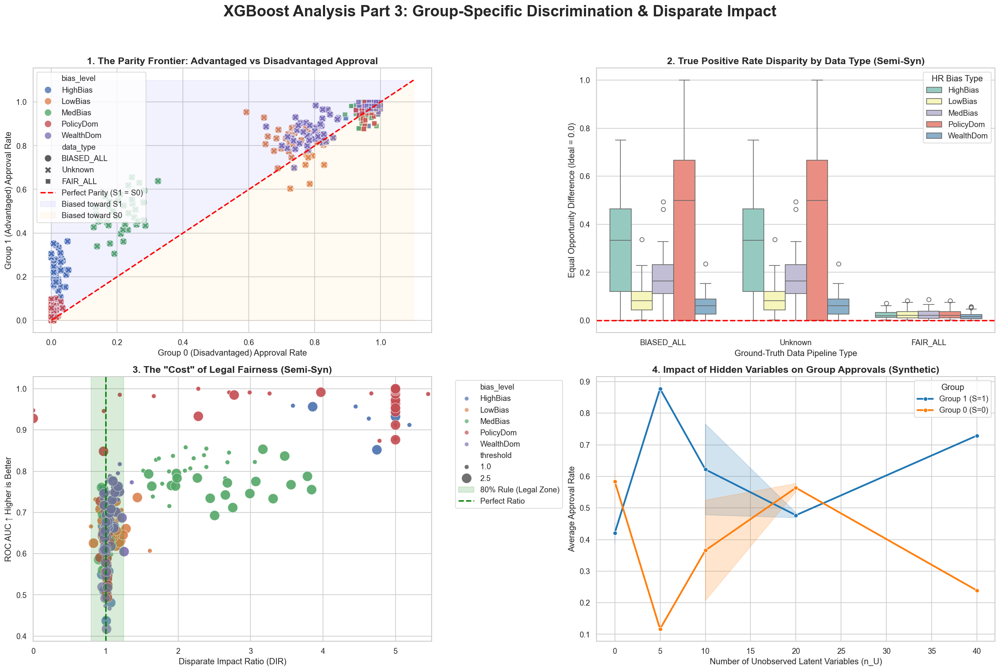

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling for the charts
sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_clean_xgb_data_p3():
    """Loads both CSVs and ensures missing metrics are dropped for accurate plotting."""
    syn_csv = "xgb_syn_results.csv"
    semi_csv = "xgb_semi_syn_results.csv"
    
    if not os.path.exists(syn_csv) or not os.path.exists(semi_csv):
        raise FileNotFoundError("Could not find the XGBoost results CSV files in the current directory.")
        
    df_syn = pd.read_csv(syn_csv)
    df_semi = pd.read_csv(semi_csv)
    
    # Drop rows without fairness metrics
    df_syn = df_syn.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    df_semi = df_semi.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    
    # Cap infinite Disparate Impact Ratios to 5.0 for visualization
    df_syn['Disparate_Impact_Ratio'] = df_syn['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    df_semi['Disparate_Impact_Ratio'] = df_semi['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    # Ensure bias_level exists in semi_syn
    if 'bias_level' not in df_semi.columns or df_semi['bias_level'].isnull().all():
         df_semi['bias_level'] = df_semi['name_dataset'].apply(
             lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
         )
         
    return df_syn, df_semi

def plot_xgb_part3_dashboard():
    df_syn, df_semi = load_and_clean_xgb_data_p3()
    
    # Create a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('XGBoost Analysis Part 3: Group-Specific Discrimination & Disparate Impact', fontsize=22, fontweight='bold', y=0.98)

    # ---------------------------------------------------------
    # GRAPH 1: The Parity Frontier (S1 vs S0 Positivity Rates)
    # Explains: Is the model systematically favoring one group over the other?
    # ---------------------------------------------------------
    ax1 = axes[0, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Pos_Rate_S0', 
        y='Pos_Rate_S1', 
        hue='bias_level',
        style='data_type',
        s=100, alpha=0.8, ax=ax1
    )
    # Draw the Line of Perfect Parity (y=x)
    max_val = max(df_semi['Pos_Rate_S0'].max(), df_semi['Pos_Rate_S1'].max()) + 0.1
    ax1.plot([0, max_val], [0, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Parity (S1 = S0)')
    
    # Fill areas to show bias direction
    ax1.fill_between([0, max_val], [0, max_val], max_val, color='blue', alpha=0.05, label='Biased toward S1')
    ax1.fill_between([0, max_val], 0, [0, max_val], color='orange', alpha=0.05, label='Biased toward S0')
    
    ax1.set_title('1. The Parity Frontier: Advantaged vs Disadvantaged Approval', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Group 0 (Disadvantaged) Approval Rate')
    ax1.set_ylabel('Group 1 (Advantaged) Approval Rate')
    ax1.legend(loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 2: Equal Opportunity Difference by Data Type
    # Explains: Does supplying perfectly FAIR labels fix TPR disparity?
    # ---------------------------------------------------------
    ax2 = axes[0, 1]
    sns.boxplot(
        data=df_semi, 
        x='data_type', 
        y='Equal_Opportunity_Diff', 
        hue='bias_level',
        ax=ax2,
        palette='Set3'
    )
    ax2.set_title('2. True Positive Rate Disparity by Data Type (Semi-Syn)', fontsize=14, fontweight='bold')
    ax2.set_xlabel('Ground-Truth Data Pipeline Type')
    ax2.set_ylabel('Equal Opportunity Difference (Ideal = 0.0)')
    ax2.axhline(0, color='red', linestyle='--', linewidth=2)
    ax2.legend(title='HR Bias Type', loc='upper right')

    # ---------------------------------------------------------
    # GRAPH 3: Disparate Impact vs. Accuracy
    # Explains: What is the predictive cost of achieving legal fairness?
    # ---------------------------------------------------------
    ax3 = axes[1, 0]
    sns.scatterplot(
        data=df_semi, 
        x='Disparate_Impact_Ratio', 
        y='ROC_AUC', 
        hue='bias_level',
        size='threshold',
        sizes=(40, 200),
        alpha=0.7,
        ax=ax3
    )
    ax3.set_title('3. The "Cost" of Legal Fairness (Semi-Syn)', fontsize=14, fontweight='bold')
    ax3.set_xlabel('Disparate Impact Ratio (DIR)')
    ax3.set_ylabel('ROC AUC \u2191 Higher is Better')
    
    # The 80% Rule (Four-Fifths Rule) typically defines legally acceptable DIR between 0.8 and 1.25
    ax3.axvspan(0.8, 1.25, color='green', alpha=0.15, label='80% Rule (Legal Zone)')
    ax3.axvline(1.0, color='green', linestyle='--', linewidth=2, label='Perfect Ratio')
    # Extend X limit to 5.5 to catch "inf" values capped at 5.0
    ax3.set_xlim(0, 5.5) 
    
    # Fix legend
    handles, labels = ax3.get_legend_handles_labels()
    ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # ---------------------------------------------------------
    # GRAPH 4: Latent Variables vs. Group Approval Rates (Synthetic)
    # Explains: As U increases, do the groups diverge?
    # ---------------------------------------------------------
    ax4 = axes[1, 1]
    
    # Melt the synthetic data to plot both S1 and S0 rates on the same axis over n_U
    df_syn_melt = df_syn.melt(id_vars=['n_U'], value_vars=['Pos_Rate_S1', 'Pos_Rate_S0'], 
                              var_name='Group', value_name='Approval Rate')
    
    df_syn_melt['Group'] = df_syn_melt['Group'].replace({'Pos_Rate_S1': 'Group 1 (S=1)', 'Pos_Rate_S0': 'Group 0 (S=0)'})
    
    sns.lineplot(
        data=df_syn_melt, 
        x='n_U', 
        y='Approval Rate', 
        hue='Group',
        marker='o',
        linewidth=2.5,
        palette=['#1f77b4', '#ff7f0e'],
        ax=ax4,
        errorbar='ci'
    )
    ax4.set_title('4. Impact of Hidden Variables on Group Approvals (Synthetic)', fontsize=14, fontweight='bold')
    ax4.set_xlabel('Number of Unobserved Latent Variables (n_U)')
    ax4.set_ylabel('Average Approval Rate')

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_xgb_part3_dashboard()

# BENCHMARK

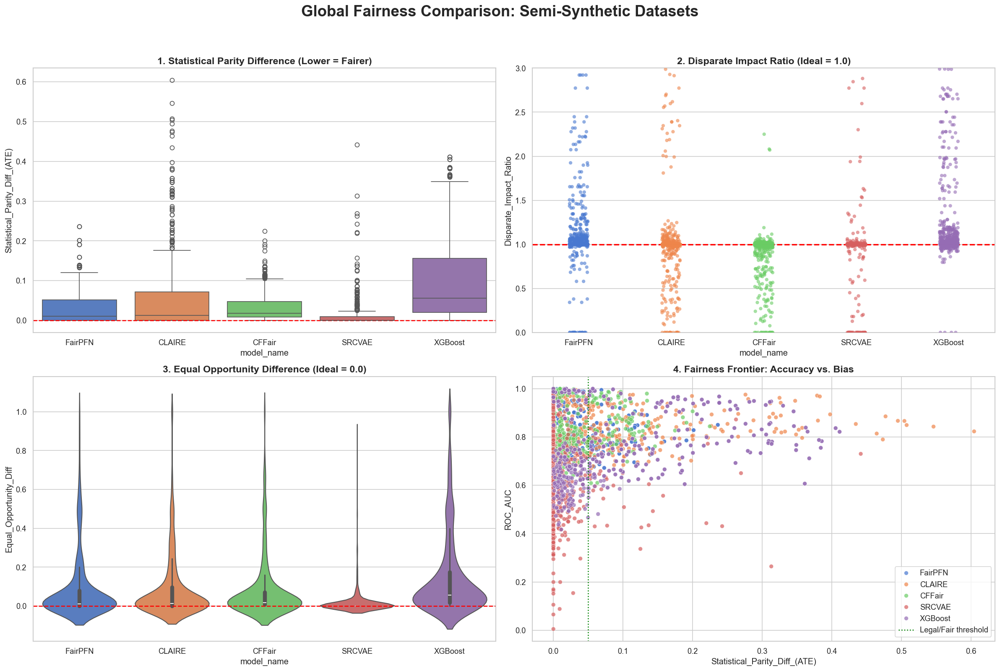

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Set high-quality styling
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams.update({'figure.dpi': 120, 'font.size': 11})

def load_and_merge_semi_syn_data():
    """Loads all model semi-synthetic CSVs and merges them into one dataframe."""
    file_map = {
        "FairPFN": "fairpfn_semi_syn_results.csv",
        "CLAIRE": "CLAIRE_semi_syn_results.csv",
        "CFFair": "CFFair_semi_syn_results.csv",
        "SRCVAE": "SRCVAE_semi_syn_results.csv",
        "XGBoost": "xgb_semi_syn_results.csv"
    }
    
    all_dfs = []
    for model_name, filename in file_map.items():
        if os.path.exists(filename):
            df = pd.read_csv(filename)
            df['model_name'] = model_name
            # Ensure bias_level exists for all models
            if 'bias_level' not in df.columns or df['bias_level'].isnull().all():
                 df['bias_level'] = df['name_dataset'].apply(
                     lambda x: x.split('_')[2] if isinstance(x, str) and len(x.split('_')) > 2 else 'Unknown'
                 )
            all_dfs.append(df)
        else:
            print(f"Warning: {filename} not found.")
            
    if not all_dfs:
        raise FileNotFoundError("No result files found in directory.")
        
    merged_df = pd.concat(all_dfs, ignore_index=True)
    
    # Cleaning
    merged_df = merged_df.dropna(subset=['Statistical_Parity_Diff_(ATE)'])
    merged_df['Disparate_Impact_Ratio'] = merged_df['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
    
    return merged_df

def plot_fairness_dashboard_semi_syn():
    df = load_and_merge_semi_syn_data()
    
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))
    fig.suptitle('Global Fairness Comparison: Semi-Synthetic Datasets', fontsize=22, fontweight='bold', y=0.98)

    # 1. Statistical Parity (ATE) Distribution by Model
    sns.boxplot(data=df, x='model_name', y='Statistical_Parity_Diff_(ATE)', hue='model_name', ax=axes[0, 0])
    axes[0, 0].set_title('1. Statistical Parity Difference (Lower = Fairer)', fontsize=14, fontweight='bold')
    axes[0, 0].axhline(0, color='red', linestyle='--')

    # 2. Disparate Impact Ratio (DIR)
    sns.stripplot(data=df, x='model_name', y='Disparate_Impact_Ratio', hue='model_name', alpha=0.6, ax=axes[0, 1])
    axes[0, 1].set_title('2. Disparate Impact Ratio (Ideal = 1.0)', fontsize=14, fontweight='bold')
    axes[0, 1].axhline(1.0, color='red', linestyle='--', linewidth=2)
    axes[0, 1].set_ylim(0, 3) # Zoom in to see the fair region clearly

    # 3. Equal Opportunity Difference (TPR Parity)
    sns.violinplot(data=df, x='model_name', y='Equal_Opportunity_Diff', hue='model_name', ax=axes[1, 0])
    axes[1, 0].set_title('3. Equal Opportunity Difference (Ideal = 0.0)', fontsize=14, fontweight='bold')
    axes[1, 0].axhline(0, color='red', linestyle='--')

    # 4. Fairness Frontier (Accuracy vs. Bias)
    sns.scatterplot(data=df, x='Statistical_Parity_Diff_(ATE)', y='ROC_AUC', hue='model_name', alpha=0.7, ax=axes[1, 1])
    axes[1, 1].set_title('4. Fairness Frontier: Accuracy vs. Bias', fontsize=14, fontweight='bold')
    axes[1, 1].axvline(0.05, color='green', linestyle=':', label='Legal/Fair threshold')
    axes[1, 1].legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    plot_fairness_dashboard_semi_syn()

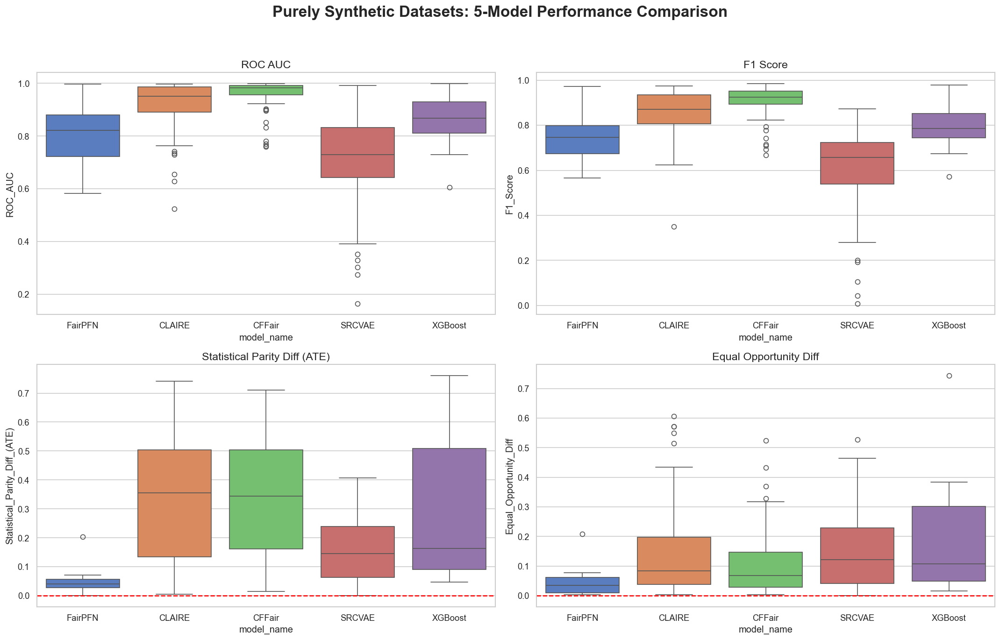

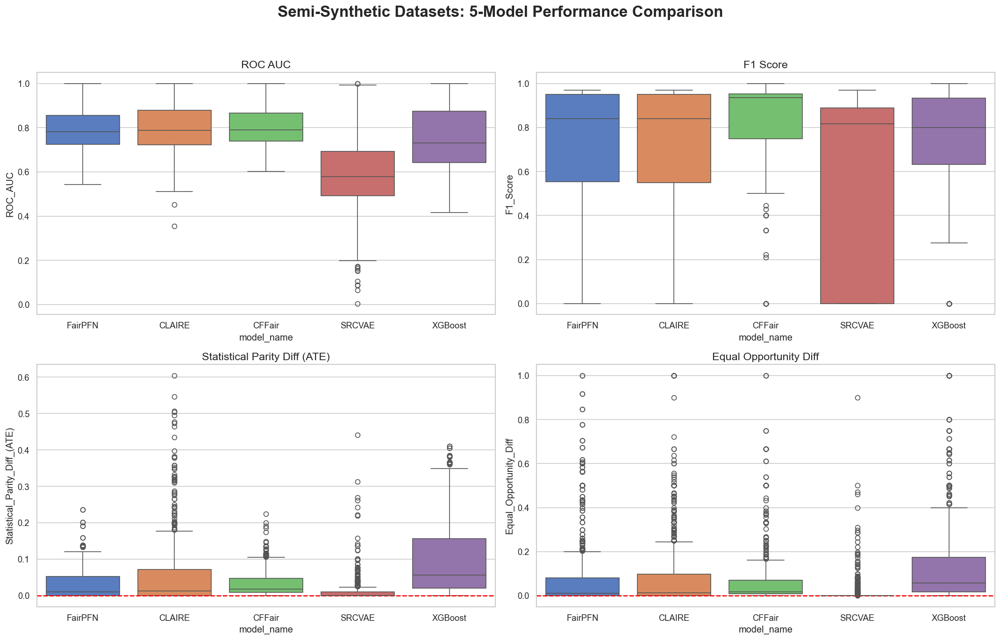

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configuration for file mappings
SYN_FILES = {
    "FairPFN": "fairpfn_results.csv",
    "CLAIRE": "CLAIRE_syn_results.csv",
    "CFFair": "CFFair_syn_results.csv",
    "SRCVAE": "SRCVAE_syn_results.csv",
    "XGBoost": "xgb_syn_results.csv"
}

SEMI_SYN_FILES = {
    "FairPFN": "fairpfn_semi_syn_results.csv",
    "CLAIRE": "CLAIRE_semi_syn_results.csv",
    "CFFair": "CFFair_semi_syn_results.csv",
    "SRCVAE": "SRCVAE_semi_syn_results.csv",
    "XGBoost": "xgb_semi_syn_results.csv"
}

def load_data(file_map):
    data_list = []
    for model_name, file_path in file_map.items():
        try:
            df = pd.read_csv(file_path)
            # Ensure model name is consistent
            df['model_name'] = model_name
            data_list.append(df)
        except FileNotFoundError:
            print(f"Warning: File {file_path} not found. Skipping {model_name}.")
    return pd.concat(data_list, ignore_index=True) if data_list else pd.DataFrame()

def create_dashboard(df, title):
    if df.empty:
        print(f"No data available for {title}.")
        return

    sns.set_theme(style="whitegrid", palette="muted")
    fig = plt.figure(figsize=(18, 12))
    fig.suptitle(f'{title}: 5-Model Performance Comparison', fontsize=20, fontweight='bold')

    # Metrics to visualize
    metrics = ['ROC_AUC', 'F1_Score', 'Statistical_Parity_Diff_(ATE)', 'Equal_Opportunity_Diff']
    
    for i, metric in enumerate(metrics):
        ax = fig.add_subplot(2, 2, i + 1)
        sns.boxplot(data=df, x='model_name', y=metric, hue='model_name', ax=ax, legend=False)
        ax.set_title(metric.replace('_', ' '), fontsize=14)
        if 'Diff' in metric:
            ax.axhline(0, color='red', linestyle='--')
            
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

if __name__ == "__main__":
    # Load and Plot Purely Synthetic
    syn_df = load_data(SYN_FILES)
    create_dashboard(syn_df, "Purely Synthetic Datasets")

    # Load and Plot Semi-Synthetic
    semi_syn_df = load_data(SEMI_SYN_FILES)
    create_dashboard(semi_syn_df, "Semi-Synthetic Datasets")

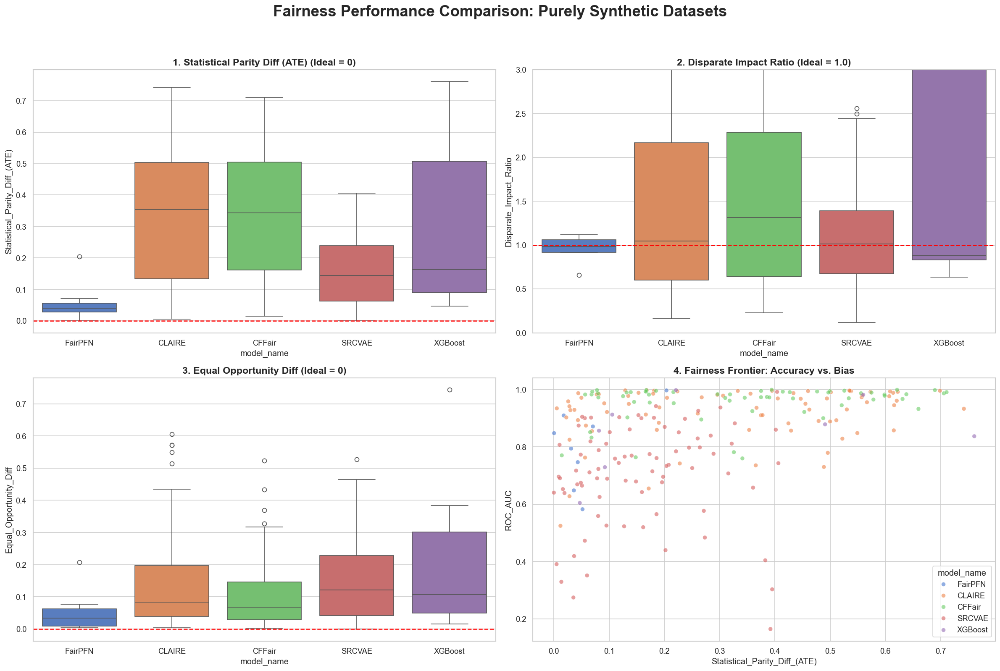

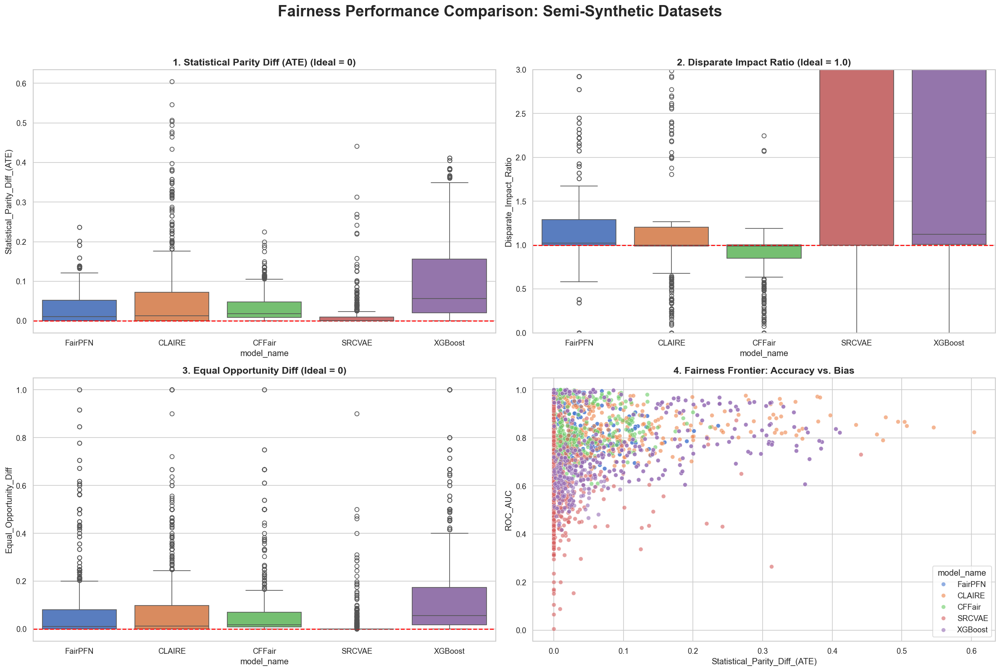

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

# Mapping of models to their respective files
SYN_FILES = {
    "FairPFN": "fairpfn_results.csv",
    "CLAIRE": "CLAIRE_syn_results.csv",
    "CFFair": "CFFair_syn_results.csv",
    "SRCVAE": "SRCVAE_syn_results.csv",
    "XGBoost": "xgb_syn_results.csv"
}

SEMI_SYN_FILES = {
    "FairPFN": "fairpfn_semi_syn_results.csv",
    "CLAIRE": "CLAIRE_semi_syn_results.csv",
    "CFFair": "CFFair_semi_syn_results.csv",
    "SRCVAE": "SRCVAE_semi_syn_results.csv",
    "XGBoost": "xgb_semi_syn_results.csv"
}

def load_data(file_map):
    data_list = []
    for model_name, filename in file_map.items():
        if os.path.exists(filename):
            df = pd.read_csv(filename)
            df['model_name'] = model_name
            # Cap infinite Disparate Impact Ratios to 5.0 for visualization
            df['Disparate_Impact_Ratio'] = df['Disparate_Impact_Ratio'].replace(np.inf, 5.0)
            data_list.append(df)
    return pd.concat(data_list, ignore_index=True) if data_list else pd.DataFrame()

def plot_fairness_dashboards():
    # Load both datasets
    syn_df = load_data(SYN_FILES)
    semi_syn_df = load_data(SEMI_SYN_FILES)
    
    datasets = [(syn_df, "Purely Synthetic"), (semi_syn_df, "Semi-Synthetic")]
    
    for df, title in datasets:
        if df.empty: continue
        
        fig, axes = plt.subplots(2, 2, figsize=(20, 14))
        fig.suptitle(f'Fairness Performance Comparison: {title} Datasets', fontsize=22, fontweight='bold', y=0.98)
        
        # 1. Statistical Parity Difference (ATE)
        sns.boxplot(data=df, x='model_name', y='Statistical_Parity_Diff_(ATE)', hue='model_name', ax=axes[0, 0])
        axes[0, 0].set_title('1. Statistical Parity Diff (ATE) (Ideal = 0)', fontsize=14, fontweight='bold')
        axes[0, 0].axhline(0, color='red', linestyle='--')
        
        # 2. Disparate Impact Ratio (DIR)
        sns.boxplot(data=df, x='model_name', y='Disparate_Impact_Ratio', hue='model_name', ax=axes[0, 1])
        axes[0, 1].set_title('2. Disparate Impact Ratio (Ideal = 1.0)', fontsize=14, fontweight='bold')
        axes[0, 1].axhline(1.0, color='red', linestyle='--')
        axes[0, 1].set_ylim(0, 3) 
        
        # 3. Equal Opportunity Difference
        sns.boxplot(data=df, x='model_name', y='Equal_Opportunity_Diff', hue='model_name', ax=axes[1, 0])
        axes[1, 0].set_title('3. Equal Opportunity Diff (Ideal = 0)', fontsize=14, fontweight='bold')
        axes[1, 0].axhline(0, color='red', linestyle='--')
        
        # 4. Parity vs. Accuracy Scatter (Fairness/Accuracy Trade-off)
        sns.scatterplot(data=df, x='Statistical_Parity_Diff_(ATE)', y='ROC_AUC', hue='model_name', alpha=0.6, ax=axes[1, 1])
        axes[1, 1].set_title('4. Fairness Frontier: Accuracy vs. Bias', fontsize=14, fontweight='bold')
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

if __name__ == "__main__":
    plot_fairness_dashboards()